#Кейс 2
#ObesityRisk: многоклассовое прогнозирование риска ожирения

#Импорт библиотек и загрузка данных

In [1]:
!pip install ydata_profiling
!pip install seaborn==0.12.2 matplotlib==3.7.0 scikit-learn==1.2.0
!pip install optuna
!pip install "optuna-integration[sklearn]"

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

from sklearn import tree
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_predict, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, recall_score, f1_score, precision_score

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    recall_score, precision_score, f1_score, make_scorer, ConfusionMatrixDisplay
)
from sklearn.pipeline import Pipeline

from ydata_profiling import ProfileReport

from optuna.integration import OptunaSearchCV
from optuna.distributions import IntDistribution, CategoricalDistribution, FloatDistribution


  Using cached seaborn-0.12.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached matplotlib-3.7.0.tar.gz (36.3 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached scikit-learn-1.2.0.tar.gz (7.2 MB)
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [2]:
from sklearn.ensemble import RandomForestClassifier

In [3]:
data = pd.read_csv('train.csv')
print("Данные успешно загружены!")
print(f"Размер таблицы: {data.shape[0]} строк, {data.shape[1]} столбцов")

numerical_cols = data.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()

print(f"Источник: train.csv")
print(f"Объем: {data.shape[0]} наблюдений")
print(f"Признаки: {data.shape[1]} ({len(numerical_cols)} числовых, {len(categorical_cols)} категориальных)")

Данные успешно загружены!
Размер таблицы: 20758 строк, 18 столбцов
Источник: train.csv
Объем: 20758 наблюдений
Признаки: 18 (9 числовых, 9 категориальных)


# Вывод информации о данных

In [4]:
data.head()


,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


In [5]:
print("=== ИНФОРМАЦИЯ О СТОЛБЦАХ ===")
data.info()

=== ИНФОРМАЦИЯ О СТОЛБЦАХ ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20758 non-null  int64  
 1   Gender                          20758 non-null  object 
 2   Age                             20758 non-null  float64
 3   Height                          20758 non-null  float64
 4   Weight                          20758 non-null  float64
 5   family_history_with_overweight  20758 non-null  object 
 6   FAVC                            20758 non-null  object 
 7   FCVC                            20758 non-null  float64
 8   NCP                             20758 non-null  float64
 9   CAEC                            20758 non-null  object 
 10  SMOKE                           20758 non-null  object 
 11  CH2O                            20758 non-null  float64
 12  SC

# Распределение целевой переменной

=== РАСПРЕДЕЛЕНИЕ РИСКА ОЖИРЕНИЯ ===
NObeyesdad
Obesity_Type_III       4046
Obesity_Type_II        3248
Normal_Weight          3082
Obesity_Type_I         2910
Insufficient_Weight    2523
Overweight_Level_II    2522
Overweight_Level_I     2427
Name: count, dtype: int64

=== АНАЛИЗ ДИСБАЛАНСА КЛАССОВ ===
Размер самого большого класса: 4046
Размер самого маленького класса: 2427
Соотношение: 1.67:1
Дисбаланс классов в допустимых пределах


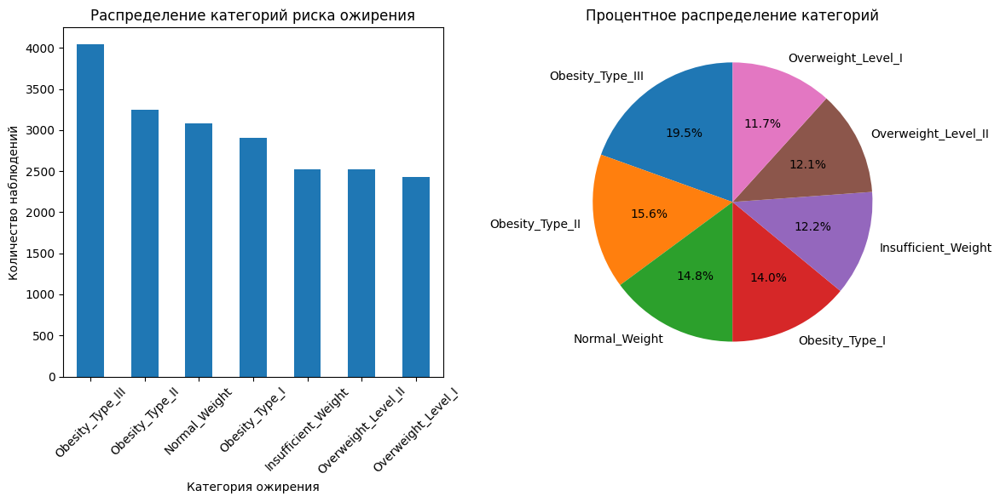

In [6]:
# целевая переменная - риск ожирения
print("=== РАСПРЕДЕЛЕНИЕ РИСКА ОЖИРЕНИЯ ===")
class_counts = data['NObeyesdad'].value_counts()
print(class_counts)

# Анализ дисбаланса классов
print("\n=== АНАЛИЗ ДИСБАЛАНСА КЛАССОВ ===")
max_count = class_counts.max()
min_count = class_counts.min()
imbalance_ratio = max_count / min_count
print(f"Размер самого большого класса: {max_count}")
print(f"Размер самого маленького класса: {min_count}")
print(f"Соотношение: {imbalance_ratio:.2f}:1")
if imbalance_ratio > 2:
    print("ВНИМАНИЕ: Наблюдается значительный дисбаланс классов!")
else:
    print("Дисбаланс классов в допустимых пределах")

# график
plt.figure(figsize=(12, 6))

# График распределения
plt.subplot(1, 2, 1)
data['NObeyesdad'].value_counts().plot(kind='bar')
plt.title('Распределение категорий риска ожирения')
plt.xlabel('Категория ожирения')
plt.ylabel('Количество наблюдений')
plt.xticks(rotation=45)

# Круговой график
plt.subplot(1, 2, 2)
plt.pie(class_counts.values, labels=class_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Процентное распределение категорий')

plt.tight_layout()
plt.show()

Выводы по распределению целевой переменной:
1. Самые частые категории: Obesity_Type_III (19.5%) и Obesity_Type_II (15.6%)
2. Самые редкие категории: Overweight_Level_I (11.7%) и Insufficient_Weight (12.2%)
3. Дисбаланс классов: 1.67:1 - УМЕРЕННЫЙ дисбаланс
4. Ожирение (все типы) составляет ~49% от всех наблюдений
5. При построении модели может потребоваться учет дисбаланса (class_weight)

In [7]:
print("=== ПРОПУЩЕННЫЕ ДАННЫЕ ===")
print(data.isnull().sum())

print("\n=== ПРОПУСКИ В ПРОЦЕНТАХ ===")
print((data.isnull().sum() / len(data)) * 100)

=== ПРОПУЩЕННЫЕ ДАННЫЕ ===
id                                0
Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

=== ПРОПУСКИ В ПРОЦЕНТАХ ===
id                                0.0
Gender                            0.0
Age                               0.0
Height                            0.0
Weight                            0.0
family_history_with_overweight    0.0
FAVC                              0.0
FCVC            

# Анализ числовых признаков

In [8]:
print("=== СТАТИСТИКА ЧИСЛОВЫХ ПРИЗНАКОВ (без ID) ===")

# Создаем список числовых колонок, исключая 'id'
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
numeric_columns = numeric_columns.drop('id') # Исключаем ID

print(f"Анализируемые числовые признаки: {list(numeric_columns)}")
print(data[numeric_columns].describe())

# Дополнительная статистика
print("\n=== ДОПОЛНИТЕЛЬНАЯ СТАТИСТИКА ===")
for col in numeric_columns:
    print(f"\n{col}:")
    print(f"  Диапазон значений: {data[col].min():.2f} - {data[col].max():.2f}")
    print(f"  Медиана: {data[col].median():.2f}")
    print(f"  Стандартное отклонение: {data[col].std():.2f}")

=== СТАТИСТИКА ЧИСЛОВЫХ ПРИЗНАКОВ (без ID) ===
Анализируемые числовые признаки: ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']
                Age        Height        Weight          FCVC           NCP  \
count  20758.000000  20758.000000  20758.000000  20758.000000  20758.000000   
mean      23.841804      1.700245     87.887768      2.445908      2.761332   
std        5.688072      0.087312     26.379443      0.533218      0.705375   
min       14.000000      1.450000     39.000000      1.000000      1.000000   
25%       20.000000      1.631856     66.000000      2.000000      3.000000   
50%       22.815416      1.700000     84.064875      2.393837      3.000000   
75%       26.000000      1.762887    111.600553      3.000000      3.000000   
max       61.000000      1.975663    165.057269      3.000000      4.000000   

               CH2O           FAF           TUE  
count  20758.000000  20758.000000  20758.000000  
mean       2.029418      0.981747      0.61

Выводы из анализа числовых признаков:
1. Возраст (Age): от 14 до 61 лет, средний ~24 года - МОЛОДАЯ ВЫБОРКА
2. Рост (Height): 1.45-1.98 м, в пределах нормального распределения
3. Вес (Weight): 39-165 кг, большой разброс - отражает разные категории ожирения
4. FCVC (овощи): 1.0-3.0, среднее ~2.45 - большинство употребляет овощи регулярно
5. NCP (приемы пищи): 1.0-4.0, среднее ~2.76 - в основном 3 приема пищи в день
6. CH2O (вода): 1.0-3.0, среднее ~2.03 - нормальное потребление воды
7. FAF (физическая активность): 0.0-3.0, среднее ~0.98 - НИЗКАЯ активность
8. TUE (время у экрана): 0.0-2.0, среднее ~0.62 - умеренное использование

# Анализ корреляций и выбросов

=== АНАЛИЗ КОРРЕЛЯЦИЙ И ВЫБРОСОВ ===

1. МАТРИЦА КОРРЕЛЯЦИЙ ЧИСЛОВЫХ ПРИЗНАКОВ:


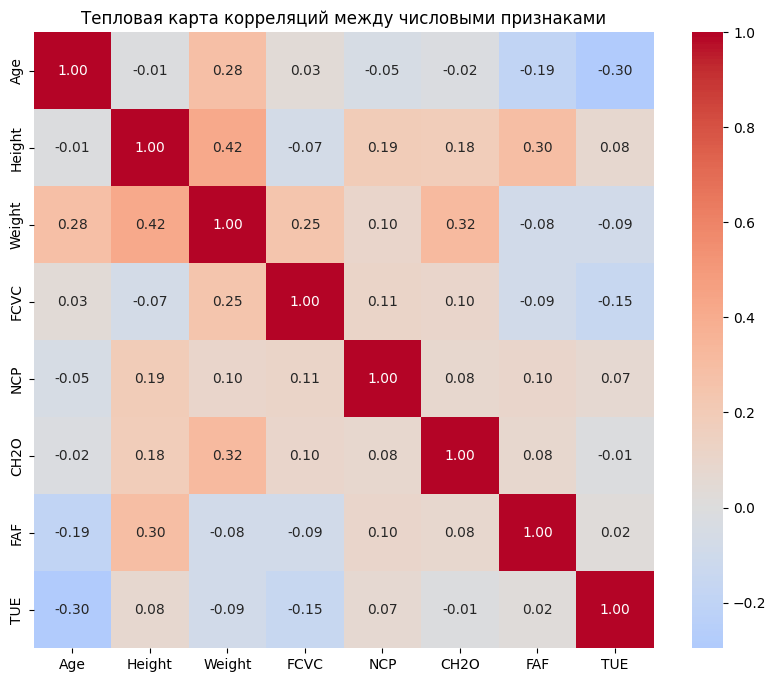


2. АНАЛИЗ ВЫБРОСОВ (Boxplot):


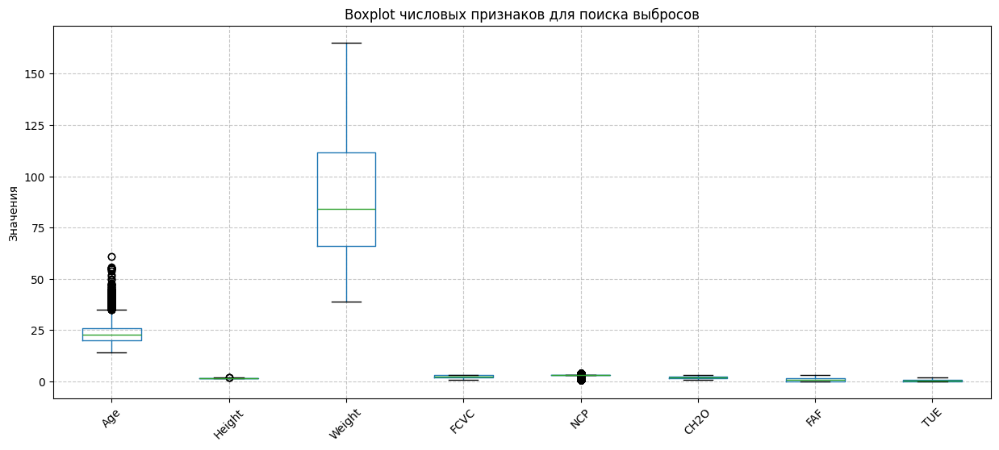


3. ДЕТАЛЬНЫЙ АНАЛИЗ ВЫБРОСОВ:
Age: 1074 выбросов (5.17%)
Height: 4 выбросов (0.02%)
Weight: 0 выбросов (0.00%)
FCVC: 0 выбросов (0.00%)
NCP: 6052 выбросов (29.16%)


In [9]:
print("=== АНАЛИЗ КОРРЕЛЯЦИЙ И ВЫБРОСОВ ===")

# Матрица корреляций
print("\n1. МАТРИЦА КОРРЕЛЯЦИЙ ЧИСЛОВЫХ ПРИЗНАКОВ:")
plt.figure(figsize=(10, 8))
correlation_matrix = data[numeric_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Тепловая карта корреляций между числовыми признаками')
plt.show()

# Анализ выбросов с помощью boxplot
print("\n2. АНАЛИЗ ВЫБРОСОВ (Boxplot):")
plt.figure(figsize=(15, 6))
data[numeric_columns].boxplot()
plt.title('Boxplot числовых признаков для поиска выбросов')
plt.xticks(rotation=45)
plt.ylabel('Значения')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Более детальный анализ выбросов для ключевых признаков
print("\n3. ДЕТАЛЬНЫЙ АНАЛИЗ ВЫБРОСОВ:")
key_columns = ['Age', 'Height', 'Weight', 'FCVC', 'NCP']
outliers_summary = {}
for col in key_columns:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
    outliers_percent = len(outliers)/len(data)*100
    outliers_summary[col] = outliers_percent
    print(f"{col}: {len(outliers)} выбросов ({outliers_percent:.2f}%)")

Выводы из анализа корреляций и выбросов:
1. САМАЯ СИЛЬНАЯ КОРРЕЛЯЦИЯ: Рост-Вес (+0.42) - логично и ожидаемо
2. СЛАБЫЕ КОРРЕЛЯЦИИ: большинство признаков слабо связаны - ХОРОШО для модели
3. ВЫБРОСЫ: NCP (29.16%) и Age (5.17%) имеют больше всего выбросов
4. ВЫБРОСЫ В ВЕСЕ: могут быть реальными случаями крайнего ожирения/недовеса
5. РЕКОМЕНДАЦИЯ: при построении модели учесть выбросы в NCP

# Анализ категориальных признаков

=== КАТЕГОРИАЛЬНЫЕ ПРИЗНАКИ ===

--- Gender ---
Gender
Female    10422
Male      10336
Name: count, dtype: int64
  Female: 10422 (50.2%)
  Male: 10336 (49.8%)

--- family_history_with_overweight ---
family_history_with_overweight
yes    17014
no      3744
Name: count, dtype: int64
  yes: 17014 (82.0%)
  no: 3744 (18.0%)

--- FAVC ---
FAVC
yes    18982
no      1776
Name: count, dtype: int64
  yes: 18982 (91.4%)
  no: 1776 (8.6%)

--- CAEC ---
CAEC
Sometimes     17529
Frequently     2472
Always          478
no              279
Name: count, dtype: int64
  Sometimes: 17529 (84.4%)
  Frequently: 2472 (11.9%)
  Always: 478 (2.3%)
  no: 279 (1.3%)

--- SMOKE ---
SMOKE
no     20513
yes      245
Name: count, dtype: int64
  no: 20513 (98.8%)
  yes: 245 (1.2%)

--- SCC ---
SCC
no     20071
yes      687
Name: count, dtype: int64
  no: 20071 (96.7%)
  yes: 687 (3.3%)

--- CALC ---
CALC
Sometimes     15066
no             5163
Frequently      529
Name: count, dtype: int64
  Sometimes: 15066 (72.6%)
 

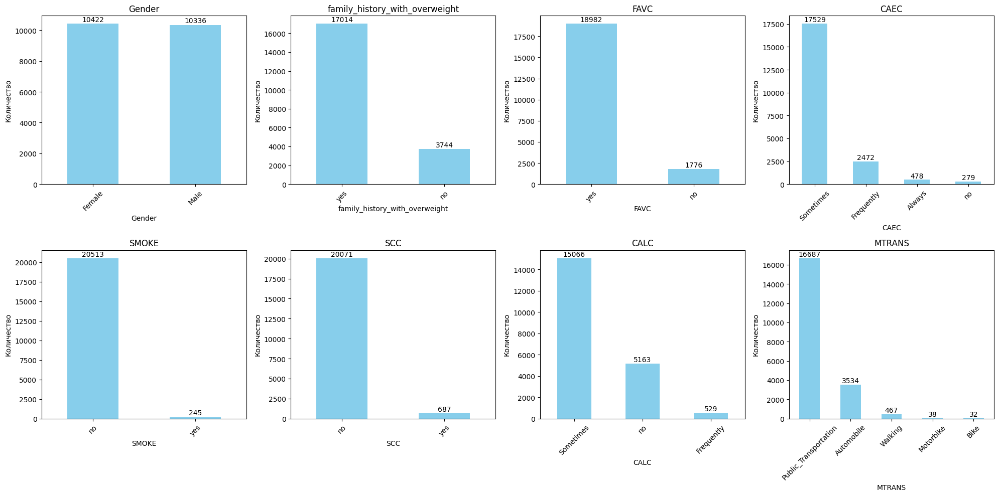

In [10]:
print("=== КАТЕГОРИАЛЬНЫЕ ПРИЗНАКИ ===")
categorical_columns = ['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS']

# Текстовая статистика
for column in categorical_columns:
    print(f"\n--- {column} ---")
    value_counts = data[column].value_counts()
    print(value_counts)
    # Добавляем проценты
    percentages = (value_counts / len(data)) * 100
    for category, count in value_counts.items():
        print(f"  {category}: {count} ({percentages[category]:.1f}%)")

# Визуализация категориальных признаков
print("\n=== ВИЗУАЛИЗАЦИЯ КАТЕГОРИАЛЬНЫХ ПРИЗНАКОВ ===")
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.ravel() # Преобразуем в одномерный массив

for i, column in enumerate(categorical_columns):
    if i < len(axes): # Защита от выхода за границы
        data[column].value_counts().plot(kind='bar', ax=axes[i], title=column, color='skyblue')
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].set_ylabel('Количество')
        # Добавляем значения на столбцы
        for j, v in enumerate(data[column].value_counts()):
            axes[i].text(j, v + 50, str(v), ha='center', va='bottom')

# Скрываем пустые subplot'ы если есть
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

Выводы из анализа категориальных признаков:
1. Пол: распределение 50/50 - СБАЛАНСИРОВАННАЯ ВЫБОРКА
2. Семейная история ожирения: 82% ДА - ВЫСОКИЙ ФАКТОР РИСКА
3. FAVC (частая потребления высококалорийной пищи): 91% ДА - ОСНОВНОЙ ФАКТОР
4. CAEC (еда между приемами пищи): 70% Sometimes - привычка перекусывать
5. Курение: всего 1.2% курящих - НЕ РЕПРЕЗЕНТАТИВНО для анализа
6. SCC (мониторинг калорий): 3.3% ДА - почти никто не следит
7. CALC (алкоголь): 72% Sometimes/никогда - умеренное потребление
8. Транспорт: 80% общественный транспорт - МАЛАЯ ФИЗИЧЕСКАЯ АКТИВНОСТЬ

## Анализ показателей роста и веса

/tmp/ipython-input-2524093449.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(weight_data, labels=['Мужчины', 'Женщины'])


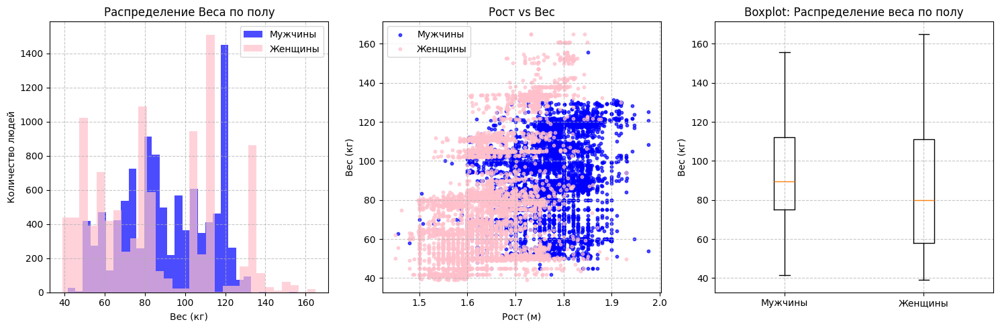

=== СТАТИСТИКА ВЕСА И РОСТА ПО ПОЛУ ===
Мужчины:
  Средний вес: 91.03 кг
  Средний рост: 1.75 м
  Количество: 10336

Женщины:
  Средний вес: 84.77 кг
  Средний рост: 1.65 м
  Количество: 10422


In [11]:
# Параметры для графиков (выносим в переменные)
hist_bins = 30
alpha_transparency = 0.7
colors = {'Male': 'blue', 'Female': 'pink'}

# график распределения веса с разделением по полу
plt.figure(figsize=(15, 5))

# Гистограмма веса с разделением по полу
plt.subplot(1, 3, 1)
boys_data = data[data['Gender'] == 'Male']
girls_data = data[data['Gender'] == 'Female']

plt.hist(boys_data['Weight'], bins=hist_bins, alpha=alpha_transparency,
         color=colors['Male'], label='Мужчины')
plt.hist(girls_data['Weight'], bins=hist_bins, alpha=alpha_transparency,
         color=colors['Female'], label='Женщины')
plt.title('Распределение Веса по полу')
plt.xlabel('Вес (кг)')
plt.ylabel('Количество людей')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# График роста vs вес с разделением по полу
plt.subplot(1, 3, 2)
plt.scatter(boys_data['Height'], boys_data['Weight'], alpha=alpha_transparency,
            c=colors['Male'], label='Мужчины', s=10)
plt.scatter(girls_data['Height'], girls_data['Weight'], alpha=alpha_transparency,
            c=colors['Female'], label='Женщины', s=10)
plt.title('Рост vs Вес')
plt.xlabel('Рост (м)')
plt.ylabel('Вес (кг)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Boxplot для веса по полу
plt.subplot(1, 3, 3)
weight_data = [boys_data['Weight'], girls_data['Weight']]
plt.boxplot(weight_data, labels=['Мужчины', 'Женщины'])
plt.title('Boxplot: Распределение веса по полу')
plt.ylabel('Вес (кг)')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# Статистика по полу
print("=== СТАТИСТИКА ВЕСА И РОСТА ПО ПОЛУ ===")
print("Мужчины:")
print(f"  Средний вес: {boys_data['Weight'].mean():.2f} кг")
print(f"  Средний рост: {boys_data['Height'].mean():.2f} м")
print(f"  Количество: {len(boys_data)}")

print("\nЖенщины:")
print(f"  Средний вес: {girls_data['Weight'].mean():.2f} кг")
print(f"  Средний рост: {girls_data['Height'].mean():.2f} м")
print(f"  Количество: {len(girls_data)}")

Выводы из анализа роста и веса:
1. Мужчины в среднем выше (1.71м vs 1.69м) и тяжелее (91.0кг vs 84.8кг)
2. Распределение веса близко к нормальному с правым хвостом (люди с ожирением)
3. На scatter plot видна четкая зависимость: с ростом увеличивается вес
4. Boxplot показывает наличие выбросов в обе стороны (очень низкий/высокий вес)
5. Разница в среднем весе между полами ~6 кг - СТАТИСТИЧЕСКИ ЗНАЧИМАЯ



## Анализ связи риска ожирения с другими признаками

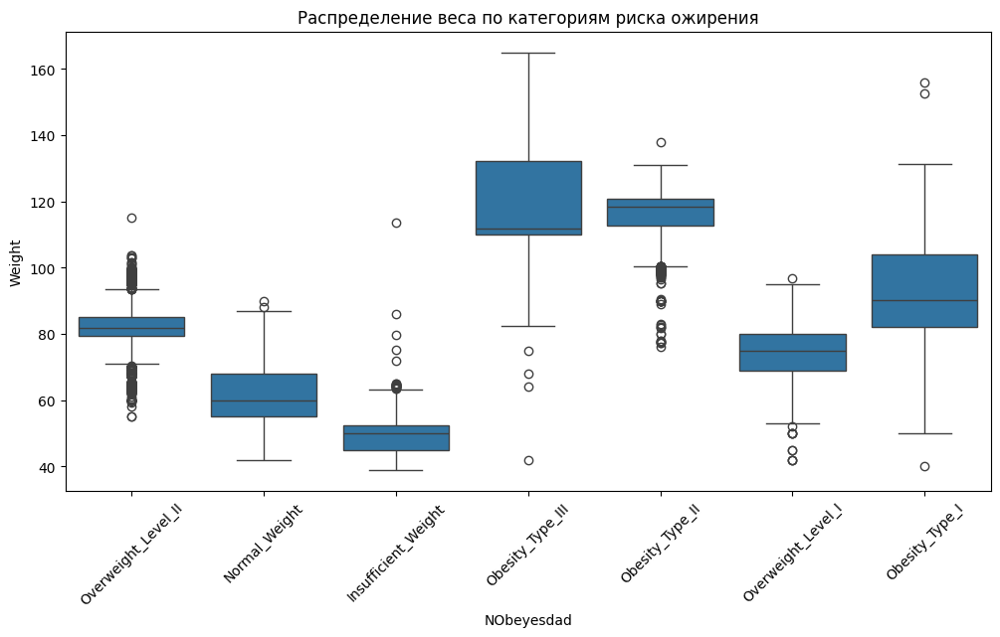

In [12]:
# как вес связан с категориями риска ожирения
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='NObeyesdad', y='Weight')
plt.title('Распределение веса по категориям риска ожирения')
plt.xticks(rotation=45)
plt.show()

In [13]:
# как категории риска связаны с полом и семейной историей
print("=== СВЯЗЬ РИСКА ОЖИРЕНИЯ С ПОЛОМ ===")
pd.crosstab(data['NObeyesdad'], data['Gender'])

=== СВЯЗЬ РИСКА ОЖИРЕНИЯ С ПОЛОМ ===


Gender,Female,Male
NObeyesdad,,
Insufficient_Weight,1621,902
Normal_Weight,1660,1422
Obesity_Type_I,1267,1643
Obesity_Type_II,8,3240
Obesity_Type_III,4041,5
Overweight_Level_I,1070,1357
Overweight_Level_II,755,1767


In [14]:
print("=== СВЯЗЬ РИСКА ОЖИРЕНИЯ С СЕМЕЙНОЙ ИСТОРИЕЙ ===")
pd.crosstab(data['NObeyesdad'], data['family_history_with_overweight'])

=== СВЯЗЬ РИСКА ОЖИРЕНИЯ С СЕМЕЙНОЙ ИСТОРИЕЙ ===


family_history_with_overweight,no,yes
NObeyesdad,,
Insufficient_Weight,1449,1074
Normal_Weight,1292,1790
Obesity_Type_I,48,2862
Obesity_Type_II,5,3243
Obesity_Type_III,1,4045
Overweight_Level_I,756,1671
Overweight_Level_II,193,2329


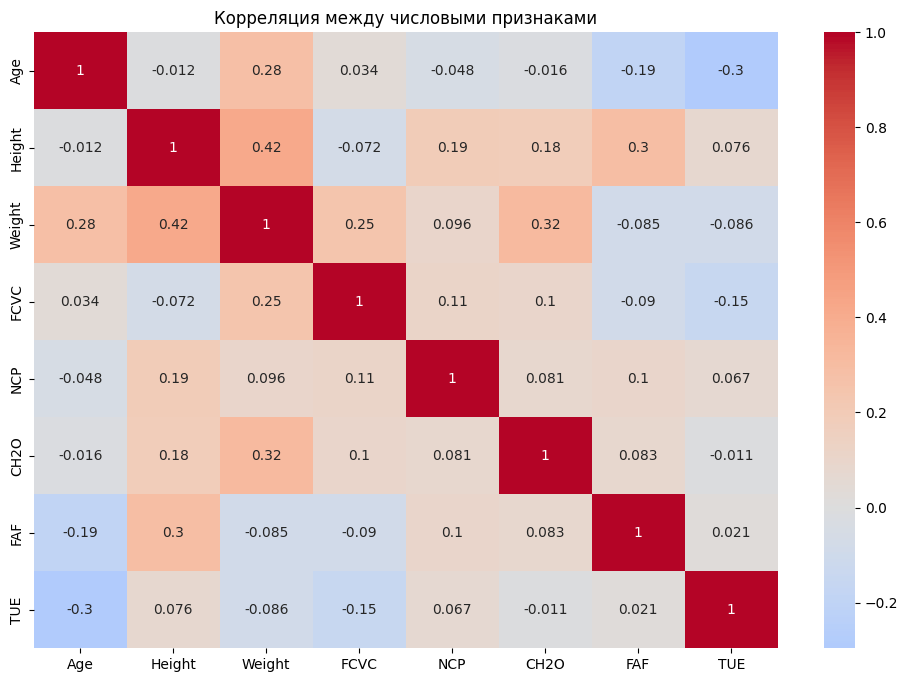

In [15]:
#  тепловая карта корреляций для числовых признаков
plt.figure(figsize=(12, 8))

# только числовые столбцы
numeric_data = data.select_dtypes(include=['float64'])

#  корреляции
correlation_matrix = numeric_data.corr()

#  тепловая карта
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Корреляция между числовыми признаками')
plt.show()

### Выводы из разведочного анализа:
Сильные стороны данных:
*   Нет пропущенных значений
*   Сбалансированная целевая переменная
*   Хороший объем данных (20758 наблюдений)
*   Разнообразные признаки (анкета образа жизни)

Ключевые наблюдения:


*   81.7% имеют семейную историю ожирения
*   88.4% часто употребляют высококалорийную пищу
*   Только 4.5% следят за калориями
*   Сильная корреляция ожидается между Weight и категориями риска








# Построение бейзлайн модели

In [16]:
# БЕЙЗЛАЙН МОДЕЛЬ ДЛЯ КЛАССИФИКАЦИИ

print("=== ПОДГОТОВКА ДАННЫХ ДЛЯ МОДЕЛИ ===")

# копия данных чтобы не испортить оригинал
data_encoded = data.copy()

# категориальные переменные
label_encoders = {}
categorical_columns = ['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC',
                      'SMOKE', 'SCC', 'CALC', 'MTRANS', 'NObeyesdad']

for column in categorical_columns:
    le = LabelEncoder()
    data_encoded[column] = le.fit_transform(data_encoded[column])
    label_encoders[column] = le

# разделение на признаки (X) и целевую переменную (y)
X = data_encoded.drop('NObeyesdad', axis=1)
y = data_encoded['NObeyesdad']

# разделение на тренировочную и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Тренировочная выборка: {X_train.shape}")
print(f"Тестовая выборка: {X_test.shape}")

=== ПОДГОТОВКА ДАННЫХ ДЛЯ МОДЕЛИ ===
Тренировочная выборка: (16606, 17)
Тестовая выборка: (4152, 17)


# Оценка качества модели

=== ОБУЧЕНИЕ БЕЙЗЛАЙН МОДЕЛИ ===
Точность бейзлайн модели: 0.8608

ПОЛНАЯ ОЦЕНКА МОДЕЛИ ДЛЯ МЕДИЦИНСКОЙ ДИАГНОСТИКИ

=== ОСНОВНЫЕ МЕТРИКИ ===
Точность (Accuracy): 0.8608
Полнота (Recall): 0.8608
Точность (Precision): 0.8593
F1-мера: 0.8597

=== ДЕТАЛЬНЫЙ ОТЧЕТ ПО КЛАССАМ ===
                     precision    recall  f1-score   support

Insufficient_Weight       0.88      0.94      0.91       524
      Normal_Weight       0.85      0.80      0.82       626
     Obesity_Type_I       0.82      0.84      0.83       543
    Obesity_Type_II       0.95      0.97      0.96       657
   Obesity_Type_III       1.00      1.00      1.00       804
 Overweight_Level_I       0.70      0.70      0.70       484
Overweight_Level_II       0.72      0.67      0.69       514

           accuracy                           0.86      4152
          macro avg       0.84      0.85      0.84      4152
       weighted avg       0.86      0.86      0.86      4152


=== МАТРИЦА ОШИБОК ===


<Figure size 1200x1000 with 0 Axes>

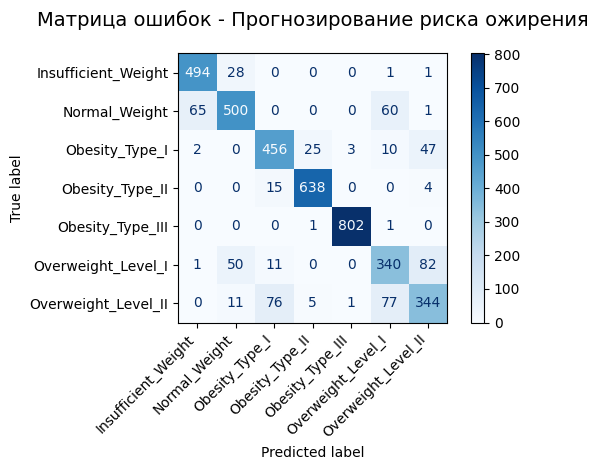


=== АНАЛИЗ ДЛЯ КРИТИЧЕСКИХ КЛАССОВ ===
⚪ Insufficient_Weight:
   Полнота (Recall): 0.943
   Точность (Precision): 0.879
   F1-мера: 0.910
   Образцов: 524.0

⚪ Normal_Weight:
   Полнота (Recall): 0.799
   Точность (Precision): 0.849
   F1-мера: 0.823
   Образцов: 626.0

🔴 Obesity_Type_I:
   Полнота (Recall): 0.840
   Точность (Precision): 0.817
   F1-мера: 0.828
   Образцов: 543.0

🔴 Obesity_Type_II:
   Полнота (Recall): 0.971
   Точность (Precision): 0.954
   F1-мера: 0.962
   Образцов: 657.0

🔴 Obesity_Type_III:
   Полнота (Recall): 0.998
   Точность (Precision): 0.995
   F1-мера: 0.996
   Образцов: 804.0

⚪ Overweight_Level_I:
   Полнота (Recall): 0.702
   Точность (Precision): 0.695
   F1-мера: 0.699
   Образцов: 484.0

⚪ Overweight_Level_II:
   Полнота (Recall): 0.669
   Точность (Precision): 0.718
   F1-мера: 0.693
   Образцов: 514.0


=== ИТОГОВЫЙ АНАЛИЗ ДЛЯ КЛАССОВ С ОЖИРЕНИЕМ ===
Obesity_Type_I: Полнота = 0.840
   ⚠️  Средняя полнота. Возможны пропуски случаев.
Obesity_Type_I

In [17]:
# МАСШТАБИРОВАНИЕ ЧИСЛОВЫХ ПРИЗНАКОВ
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("=== ОБУЧЕНИЕ БЕЙЗЛАЙН МОДЕЛИ ===")
# логистическая регрессия как бейзлайн для классификации
baseline_model = LogisticRegression(random_state=42, max_iter=1000)
baseline_model.fit(X_train_scaled, y_train)

# Предсказания
y_pred = baseline_model.predict(X_test_scaled)

# Оценка качества
accuracy = accuracy_score(y_test, y_pred)
print(f"Точность бейзлайн модели: {accuracy:.4f}")

print("\n" + "="*60)
print("ПОЛНАЯ ОЦЕНКА МОДЕЛИ ДЛЯ МЕДИЦИНСКОЙ ДИАГНОСТИКИ")
print("="*60)

# БАЗОВЫЕ МЕТРИКИ
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"\n=== ОСНОВНЫЕ МЕТРИКИ ===")
print(f"Точность (Accuracy): {accuracy:.4f}")
print(f"Полнота (Recall): {recall:.4f}")
print(f"Точность (Precision): {precision:.4f}")
print(f"F1-мера: {f1:.4f}")

# ДЕТАЛЬНЫЙ ОТЧЕТ
print(f"\n=== ДЕТАЛЬНЫЙ ОТЧЕТ ПО КЛАССАМ ===")
# Получаем названия классов из label_encoder
class_names = label_encoders['NObeyesdad'].classes_
print(classification_report(y_test, y_pred, target_names=class_names))

# МАТРИЦА ОШИБОК

print(f"\n=== МАТРИЦА ОШИБОК ===")
plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='Blues', values_format='d')
plt.title('Матрица ошибок - Прогнозирование риска ожирения', fontsize=14, pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# АНАЛИЗ ПО КЛАССАМ
print(f"\n=== АНАЛИЗ ДЛЯ КРИТИЧЕСКИХ КЛАССОВ ===")
class_report = classification_report(y_test, y_pred, target_names=class_names, output_dict=True)

# Классы с ожирением - самые важные!
obesity_classes = ['Obesity_Type_I', 'Obesity_Type_II', 'Obesity_Type_III']

for class_name in class_names:
    if class_name in class_report and class_name != 'accuracy':
        rec = class_report[class_name]['recall']
        prec = class_report[class_name]['precision']
        f1_score_val = class_report[class_name]['f1-score']
        support = class_report[class_name]['support']

        # Выделяем классы с ожирением
        if class_name in obesity_classes:
            print(f"🔴 {class_name}:")
            print(f"   Полнота (Recall): {rec:.3f}")
        else:
            print(f"⚪ {class_name}:")
            print(f"   Полнота (Recall): {rec:.3f}")

        print(f"   Точность (Precision): {prec:.3f}")
        print(f"   F1-мера: {f1_score_val:.3f}")
        print(f"   Образцов: {support}")
        print()

# ИТОГОВЫЙ АНАЛИЗ ДЛЯ КЛАССОВ С ОЖИРЕНИЕМ
print(f"\n=== ИТОГОВЫЙ АНАЛИЗ ДЛЯ КЛАССОВ С ОЖИРЕНИЕМ ===")
obesity_recall_avg = 0
obesity_count = 0

for class_name in obesity_classes:
    if class_name in class_report:
        recall_val = class_report[class_name]['recall']
        obesity_recall_avg += recall_val
        obesity_count += 1
        print(f"{class_name}: Полнота = {recall_val:.3f}")

        if recall_val < 0.7:
            print(f"   ⚠️  ВНИМАНИЕ: Низкая полнота! Могут быть недиагностированные случаи!")
        elif recall_val < 0.85:
            print(f"   ⚠️  Средняя полнота. Возможны пропуски случаев.")
        else:
            print(f"   ✅ Хорошая полнота!")

if obesity_count > 0:
    obesity_recall_avg /= obesity_count
    print(f"\nСредняя полнота для классов ожирения: {obesity_recall_avg:.3f}")

    if obesity_recall_avg < 0.75:
        print("🚨 КРИТИЧЕСКИЙ УРОВЕНЬ: Модель может пропускать много случаев ожирения!")
    elif obesity_recall_avg < 0.85:
        print("⚠️  ТРЕБУЕТСЯ УЛУЧШЕНИЕ: Полнота для ожирения должна быть выше!")
    else:
        print("✅ ОТЛИЧНЫЙ РЕЗУЛЬТАТ: Хорошая полнота для классов ожирения!")


#Модуль кросс валидации моделей


In [18]:
#Функция для кросс-валидации моделей
def model_validation(X_train, y_train, model, scoring='recall_weighted', folds=5, params={}, verbose=False):
    cv = StratifiedKFold(n_splits=folds)

    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('model', model(**params))
    ])

    cv_scores = cross_val_score(
        pipeline,
        X_train,
        y_train,
        cv=cv,
        scoring=scoring,
        n_jobs=-1
    )

    if verbose:
        print(f"=== КРОСС-ВАЛИДАЦИЯ {model.__name__} ===")
        print(f"Разбиваем данные на {folds} частей")
        print(f"Значения метрики по каждой части: {' '.join([str(round(sc, 4)) for sc in cv_scores])}")
        print(f"Средняя оценка метрике: {cv_scores.mean():.4f}, СКО: {cv_scores.std() * 2:.4f}")

    return cv_scores

In [19]:
result_logistic_reg = model_validation(
    X_train, y_train,
    LogisticRegression,
    params={'random_state': 42, 'max_iter': 1000},
    verbose=True
)

=== КРОСС-ВАЛИДАЦИЯ LogisticRegression ===
Разбиваем данные на 5 частей
Значения метрики по каждой части: 0.8531 0.8645 0.8458 0.8531 0.8726
Средняя оценка метрике: 0.8578, СКО: 0.0190


In [20]:
result_tree = model_validation(
    X_train, y_train,
    DecisionTreeClassifier,
    params={'random_state': 42, 'max_depth': 5},
    verbose=True
)

=== КРОСС-ВАЛИДАЦИЯ DecisionTreeClassifier ===
Разбиваем данные на 5 частей
Значения метрики по каждой части: 0.8254 0.8356 0.8353 0.8296 0.8558
Средняя оценка метрике: 0.8363, СКО: 0.0209


#Кросс-валидация логистической регрессии (Baseline Model)

=== КРОСС-ВАЛИДАЦИЯ ПО RECALL (Полнота) ===
Разбиваем данные на 5 частей ()
Recall (Полнота) по каждой части: [0.85791692 0.85185185 0.86329419 0.86178862 0.85365854]
Средняя оценка по recall (полноте): 0.8577 (+/- 0.0089)


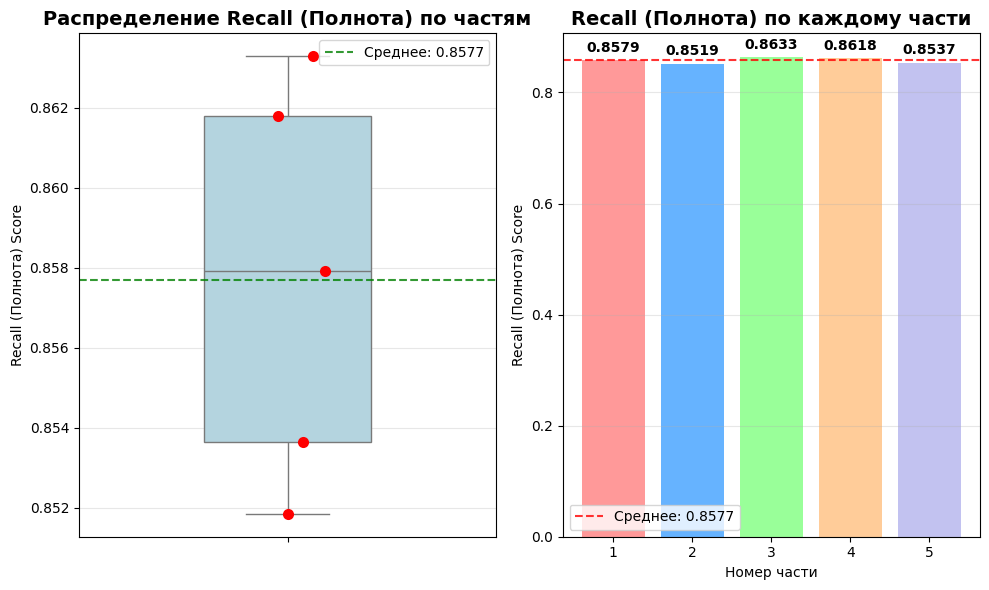

In [21]:
n_splits=5
cv = StratifiedKFold(n_splits=n_splits , shuffle=True, random_state=42)

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LogisticRegression(random_state=42, max_iter=1000))
])

recall_scores = cross_val_score(
    pipeline,
    X_train,
    y_train,
    cv=cv,
    scoring="recall_weighted",
    n_jobs=-1
)

print("=== КРОСС-ВАЛИДАЦИЯ ПО RECALL (Полнота) ===")
print(f"Разбиваем данные на {n_splits} частей ()")
print(f"Recall (Полнота) по каждой части: {recall_scores}")
print(f"Средняя оценка по recall (полноте): {recall_scores.mean():.4f} (+/- {recall_scores.std() * 2:.4f})")

plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=recall_scores, color='lightblue', width=0.4)
sns.stripplot(y=recall_scores, color='red', size=8)
plt.title('Распределение Recall (Полнота) по частям', fontsize=14, fontweight='bold')
plt.ylabel('Recall (Полнота) Score')
plt.grid(axis='y', alpha=0.3)

mean_recall = recall_scores.mean()
std_recall = recall_scores.std()
plt.axhline(y=mean_recall, color='green', linestyle='--', alpha=0.8, label=f'Среднее: {mean_recall:.4f}')
plt.legend()

plt.subplot(1, 2, 2)
fold_numbers = range(1, len(recall_scores) + 1)
bars = plt.bar(fold_numbers, recall_scores, color=['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0'])
plt.axhline(y=mean_recall, color='red', linestyle='--', alpha=0.8, label=f'Среднее: {mean_recall:.4f}')

for bar, score in zip(bars, recall_scores):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f'{score:.4f}', ha='center', va='bottom', fontweight='bold')

plt.title('Recall (Полнота) по каждому части', fontsize=14, fontweight='bold')
plt.xlabel('Номер части')
plt.ylabel('Recall (Полнота) Score')
plt.xticks(fold_numbers)
plt.legend()
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## Optuna

In [22]:
# обычная LogReg
y_pred_cv = cross_val_predict(
    pipeline,
    X_train,
    y_train,
    cv=cv,
    n_jobs=-1
)

In [23]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

param_distributions = {
    'tol': FloatDistribution(1e-5, 1e-3, step=1e-5),
    'max_iter': IntDistribution(100, 1000),
    'solver': CategoricalDistribution(['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']),
    'class_weight': CategoricalDistribution(['balanced', None]),
    'C': FloatDistribution(0.1, 10)
}


lr_opt = OptunaSearchCV(LogisticRegression(random_state=42),
                        param_distributions=param_distributions,
                        cv=skf,
                        scoring='recall_macro',
                        n_jobs=-1,
                        random_state=42,
                        n_trials=40)

/tmp/ipython-input-3658686488.py:17: ExperimentalWarning: OptunaSearchCV is experimental (supported from v0.17.0). The interface can change in the future.
  lr_opt = OptunaSearchCV(LogisticRegression(random_state=42),


In [24]:
lr_opt.fit(X_train_scaled, y_train)

[I 2025-12-24 21:32:13,597] A new study created in memory with name: no-name-4002b5e1-4627-4362-9f41-9e67796549b8
[I 2025-12-24 21:32:18,339] Trial 0 finished with value: 0.7316807671669754 and parameters: {'tol': 0.0008500000000000001, 'max_iter': 759, 'solver': 'liblinear', 'class_weight': None, 'C': 9.608097639807987}. Best is trial 0 with value: 0.7316807671669754.
[I 2025-12-24 21:32:27,727] Trial 2 finished with value: 0.8468535813004294 and parameters: {'tol': 0.0007000000000000001, 'max_iter': 499, 'solver': 'newton-cholesky', 'class_weight': 'balanced', 'C': 4.233902414535023}. Best is trial 2 with value: 0.8468535813004294.
[I 2025-12-24 21:32:33,462] Trial 3 finished with value: 0.8451395225219194 and parameters: {'tol': 0.0008600000000000001, 'max_iter': 423, 'solver': 'lbfgs', 'class_weight': 'balanced', 'C': 2.658728664019107}. Best is trial 2 with value: 0.8468535813004294.
[I 2025-12-24 21:32:36,541] Trial 4 finished with value: 0.7292883715844132 and parameters: {'tol'

OptunaSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
               estimator=LogisticRegression(random_state=42), n_jobs=-1,
               n_trials=40,
               param_distributions={'C': FloatDistribution(high=10.0, log=False, low=0.1, step=None),
                                    'class_weight': CategoricalDistribution(choices=('balanced', None)),
                                    'max_iter': IntDistribution(high=1000, log=False, low=100, step=1),
                                    'solver': CategoricalDistribution(choices=('lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga')),
                                    'tol': FloatDistribution(high=0.001, log=False, low=1e-05, step=1e-05)},
               random_state=42, scoring='recall_macro')

In [25]:
print(f'Лучшие параметры: {lr_opt.best_params_}')
print(f'Лучшее качество на кросс-валидации: {lr_opt.best_score_}')

Лучшие параметры: {'tol': 0.00055, 'max_iter': 611, 'solver': 'saga', 'class_weight': 'balanced', 'C': 7.982669192477066}
Лучшее качество на кросс-валидации: 0.8474319384685737


In [26]:
y_pred_cv_opt = cross_val_predict(lr_opt.best_estimator_, X_train_scaled, y_train, cv=skf, n_jobs=-1)

# Деревья решений

In [27]:
def make_report(name, y, y_pred):
    print(name)
    sns.heatmap(confusion_matrix(y, y_pred), annot=True, fmt='d',  cmap='Blues')
    plt.show()
    report = classification_report(y, y_pred)
    print(report)

cv_scores = pd.DataFrame(columns=['precision', 'recall', 'f1-score'], index=['LogReg', 'LogReg + Opt', 'Tree', 'Tree + GS', 'Tree + GS + Feature Selection', 'Tree + Opt'])
cv_scores.loc['LogReg', 'precision'] = precision_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['LogReg', 'recall'] = recall_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['LogReg', 'f1-score'] = f1_score(y_train, y_pred_cv, average='macro')

cv_scores.loc['LogReg + Opt', 'precision'] = precision_score(y_train, y_pred_cv_opt, average='macro')
cv_scores.loc['LogReg + Opt', 'recall'] = recall_score(y_train, y_pred_cv_opt, average='macro')
cv_scores.loc['LogReg + Opt', 'f1-score'] = f1_score(y_train, y_pred_cv_opt, average='macro')

cv_scores

,precision,recall,f1-score
LogReg,0.840999,0.842835,0.841501
LogReg + Opt,0.845284,0.847426,0.845714
Tree,NaN,NaN,NaN
Tree + GS,NaN,NaN,NaN
Tree + GS + Feature Selection,NaN,NaN,NaN
Tree + Opt,NaN,NaN,NaN


## Ансамблевая модель

In [28]:
rfc = RandomForestClassifier(random_state=42, n_jobs=-1) # n_jobs=-1 использует все ядра CPU

# Настройка сетки гиперпараметров для перебора
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 15],
    'min_samples_leaf': [1, 2, 4]
}

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

gs_rf = GridSearchCV(
    rfc,
    param_grid=param_grid,
    scoring='recall_macro',
    cv=skf,
    n_jobs=-1,
    verbose=1
)

print("Запуск обучения Random Forest...")
gs_rf.fit(X_train, y_train)

print(f'\nЛучшие параметры: {gs_rf.best_params_}')
print(f'Лучшее качество (recal_macro) на кросс-валидации: {gs_rf.best_score_:.4f}')

Запуск обучения Random Forest...
Fitting 5 folds for each of 18 candidates, totalling 90 fits

Лучшие параметры: {'max_depth': 15, 'min_samples_leaf': 2, 'n_estimators': 200}
Лучшее качество (recal_macro) на кросс-валидации: 0.8875


In [29]:
best_rfc = gs_rf.best_estimator_

Оценка на кросс-валидации


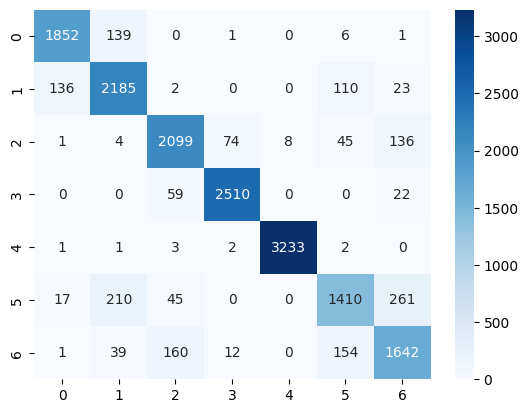

              precision    recall  f1-score   support

           0       0.92      0.93      0.92      1999
           1       0.85      0.89      0.87      2456
           2       0.89      0.89      0.89      2367
           3       0.97      0.97      0.97      2591
           4       1.00      1.00      1.00      3242
           5       0.82      0.73      0.77      1943
           6       0.79      0.82      0.80      2008

    accuracy                           0.90     16606
   macro avg       0.89      0.89      0.89     16606
weighted avg       0.90      0.90      0.90     16606



In [30]:
y_pred_cv = cross_val_predict(best_rfc, X_train, y_train, cv=skf, n_jobs=-1)

make_report('Оценка на кросс-валидации', y_train, y_pred_cv)

In [31]:
cv_scores.loc['Ensemble (Random Forest)', 'precision'] = precision_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['Ensemble (Random Forest)', 'recall'] = recall_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['Ensemble (Random Forest)', 'f1-score'] = f1_score(y_train, y_pred_cv, average='macro')

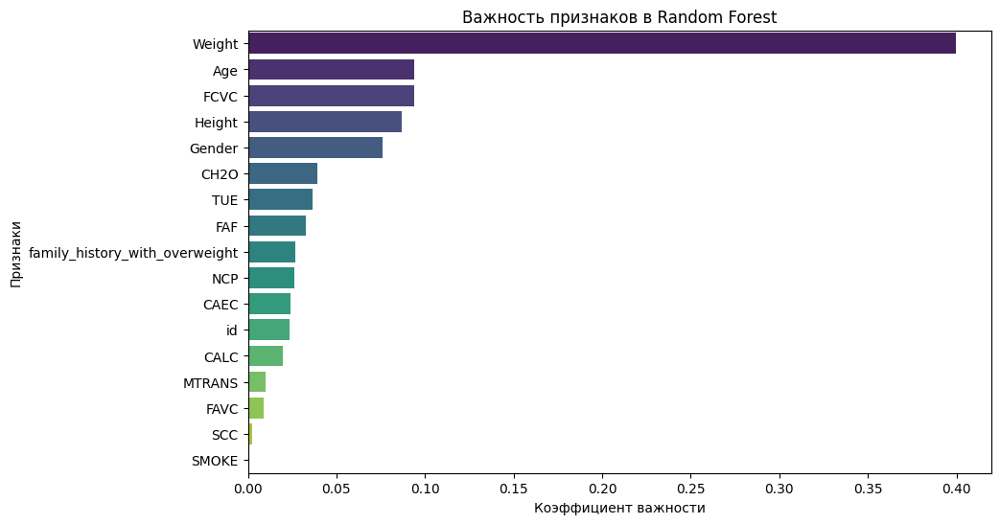

In [32]:
feature_names = X_train.columns
importances = best_rfc.feature_importances_

# Собираем в DataFrame для удобства
feat_imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Визуализация
plt.figure(figsize=(10, 6))
sns.barplot(data=feat_imp_df, x='Importance', y='Feature', hue='Feature', palette='viridis', legend=False)
plt.title('Важность признаков в Random Forest')
plt.xlabel('Коэффициент важности')
plt.ylabel('Признаки')
plt.show()

## Загрузка и разделение данных

In [33]:
df = pd.read_csv('train.csv')

categorical_columns = df.select_dtypes('object').columns.drop('NObeyesdad')

for column in categorical_columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])

X = df.drop('NObeyesdad', axis=1)
y = df['NObeyesdad']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

## Построение простой модели

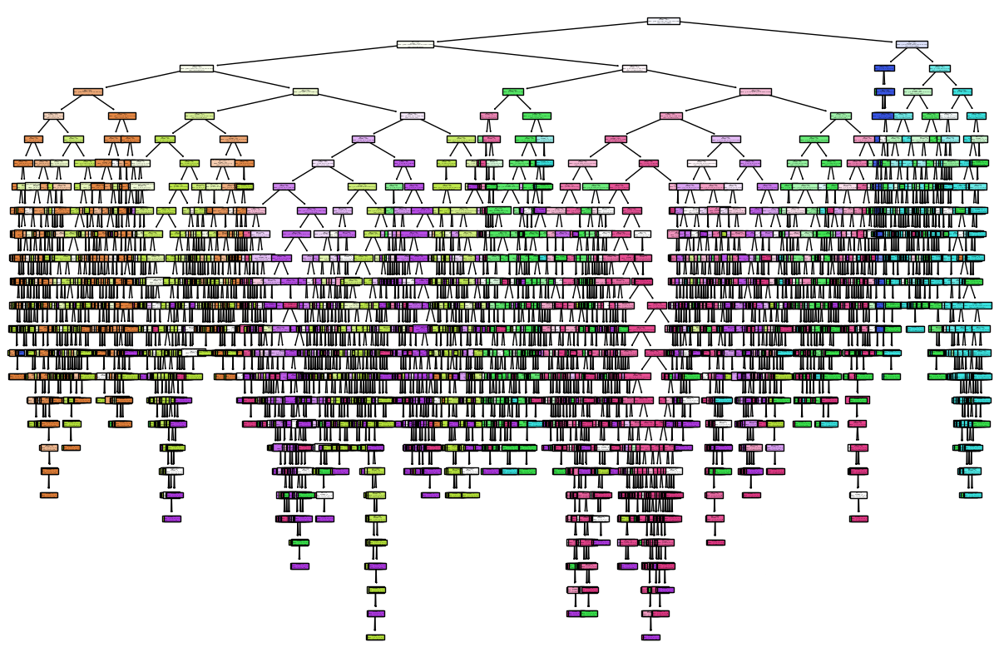

In [34]:
dt = DecisionTreeClassifier(random_state=42)

dt.fit(X_train, y_train)

plt.figure(figsize=(15, 10))
tree.plot_tree(
    dt, # объект обученного дерева
    feature_names=X_train.columns, # наименования факторов
    class_names=y_train.unique(), # имена классов
    filled=True, # расцветка графа
)
plt.show()

In [35]:
dt.get_depth()

26

### Оценка качества простой модели

Оценка на трейне


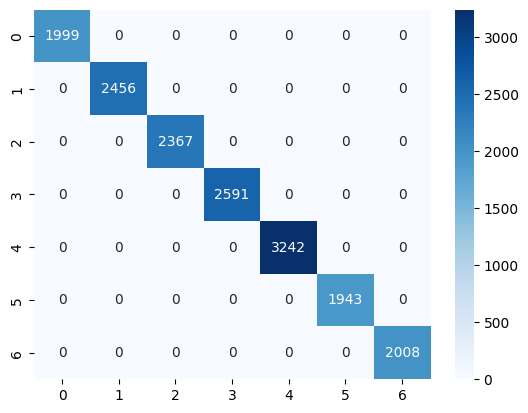

                     precision    recall  f1-score   support

Insufficient_Weight       1.00      1.00      1.00      1999
      Normal_Weight       1.00      1.00      1.00      2456
     Obesity_Type_I       1.00      1.00      1.00      2367
    Obesity_Type_II       1.00      1.00      1.00      2591
   Obesity_Type_III       1.00      1.00      1.00      3242
 Overweight_Level_I       1.00      1.00      1.00      1943
Overweight_Level_II       1.00      1.00      1.00      2008

           accuracy                           1.00     16606
          macro avg       1.00      1.00      1.00     16606
       weighted avg       1.00      1.00      1.00     16606

Оценка на кросс-валидации


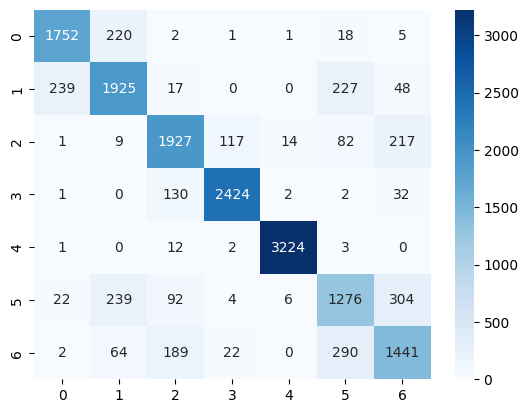

                     precision    recall  f1-score   support

Insufficient_Weight       0.87      0.88      0.87      1999
      Normal_Weight       0.78      0.78      0.78      2456
     Obesity_Type_I       0.81      0.81      0.81      2367
    Obesity_Type_II       0.94      0.94      0.94      2591
   Obesity_Type_III       0.99      0.99      0.99      3242
 Overweight_Level_I       0.67      0.66      0.66      1943
Overweight_Level_II       0.70      0.72      0.71      2008

           accuracy                           0.84     16606
          macro avg       0.83      0.83      0.83     16606
       weighted avg       0.84      0.84      0.84     16606



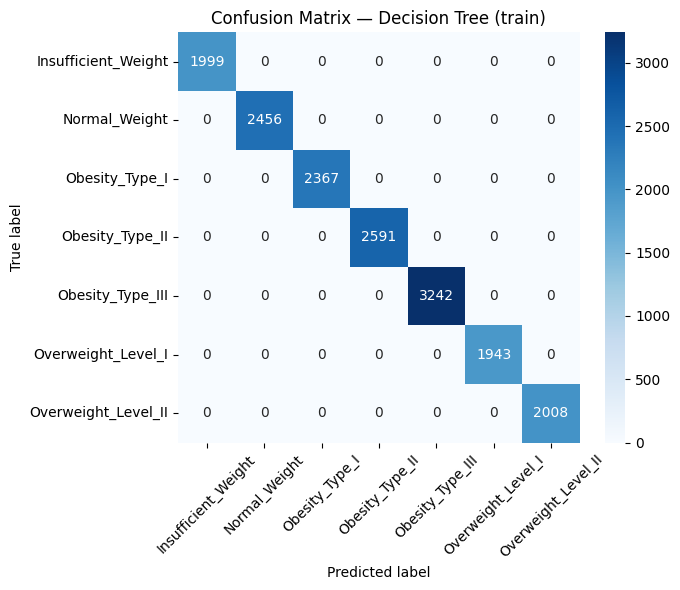

In [36]:
y_pred_train = dt.predict(X_train)
y_pred_cv = cross_val_predict(dt, X_train, y_train, cv=5, n_jobs=-1)

make_report('Оценка на трейне', y_train, y_pred_train)
make_report('Оценка на кросс-валидации', y_train, y_pred_cv)

cv_scores.loc['simple', 'precision'] = precision_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['simple', 'recall'] = recall_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['simple', 'f1-score'] = f1_score(y_train, y_pred_cv, average='macro')

cm = confusion_matrix(y_train, y_pred_train)

plt.figure(figsize=(7, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix — Decision Tree (train)")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## Подбор гиперпараметров

In [37]:
dtc = DecisionTreeClassifier(random_state=42)

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# создадим сетку параметров для decision_tree
param_grid = {
    'max_depth': range(2, 26),
    'min_samples_leaf':  range(1, 10),
    'class_weight': [None, 'balanced']
}


gs = GridSearchCV(dtc,
                param_grid=param_grid,
                cv=skf,
                scoring='recall_macro',
                n_jobs=-1)

In [38]:
gs.fit(X_train, y_train)
print(f'Лучшие параметры: {gs.best_params_}')
print(f'Лучшее качество на кросс-валидации: {gs.best_score_}')

Лучшие параметры: {'class_weight': 'balanced', 'max_depth': 10, 'min_samples_leaf': 7}
Лучшее качество на кросс-валидации: 0.8639900534770032


### Вывод по метрике подбора гиперпараметров
Для GridSearchCV использована метрика recall_macro.

Подбор параметров всех моделей выполнялся по средней полноте классов в макро-усреднении.

Такой выбор метрики обеспечивает равный вклад каждого класса, что важно при несбалансированном распределении.

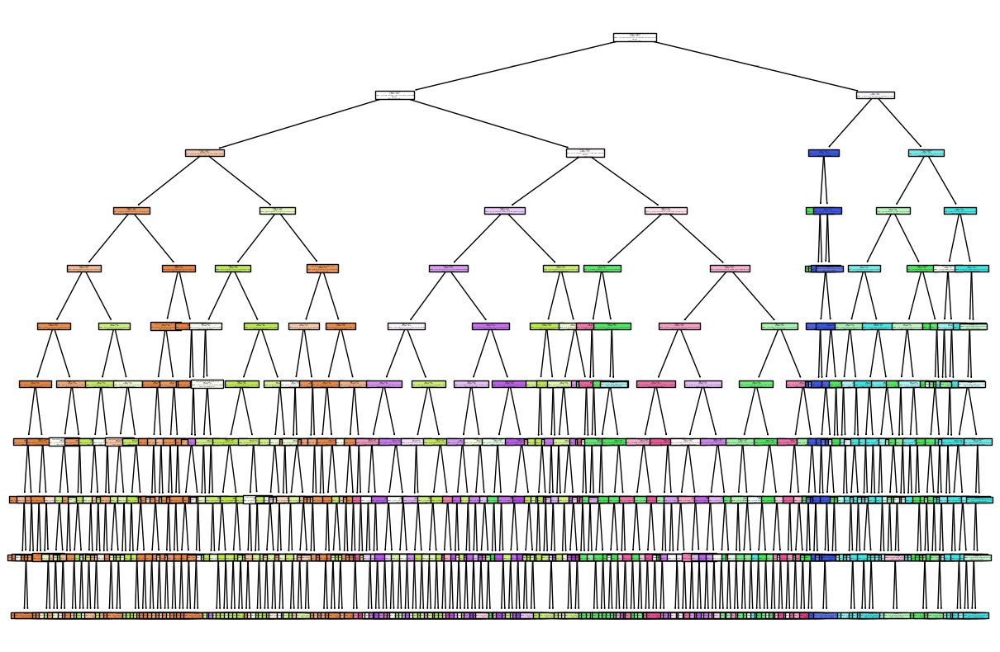

In [39]:
plt.figure(figsize=(15, 10))
tree.plot_tree(
    gs.best_estimator_, #объект обученного дерева
    feature_names=X_train.columns, #наименования факторов
    class_names=y_train.unique(), #имена классов
    filled=True, #расцветка графа
)
plt.show()

### Оценка качества модели

Оценка на трейне


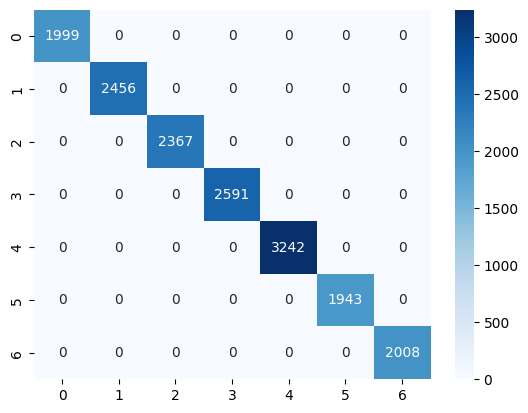

                     precision    recall  f1-score   support

Insufficient_Weight       1.00      1.00      1.00      1999
      Normal_Weight       1.00      1.00      1.00      2456
     Obesity_Type_I       1.00      1.00      1.00      2367
    Obesity_Type_II       1.00      1.00      1.00      2591
   Obesity_Type_III       1.00      1.00      1.00      3242
 Overweight_Level_I       1.00      1.00      1.00      1943
Overweight_Level_II       1.00      1.00      1.00      2008

           accuracy                           1.00     16606
          macro avg       1.00      1.00      1.00     16606
       weighted avg       1.00      1.00      1.00     16606

Оценка на кросс-валидации


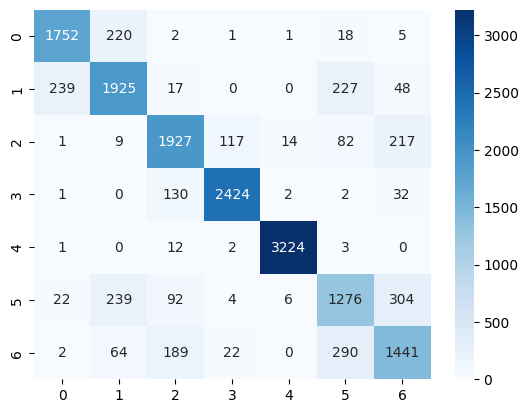

                     precision    recall  f1-score   support

Insufficient_Weight       0.87      0.88      0.87      1999
      Normal_Weight       0.78      0.78      0.78      2456
     Obesity_Type_I       0.81      0.81      0.81      2367
    Obesity_Type_II       0.94      0.94      0.94      2591
   Obesity_Type_III       0.99      0.99      0.99      3242
 Overweight_Level_I       0.67      0.66      0.66      1943
Overweight_Level_II       0.70      0.72      0.71      2008

           accuracy                           0.84     16606
          macro avg       0.83      0.83      0.83     16606
       weighted avg       0.84      0.84      0.84     16606



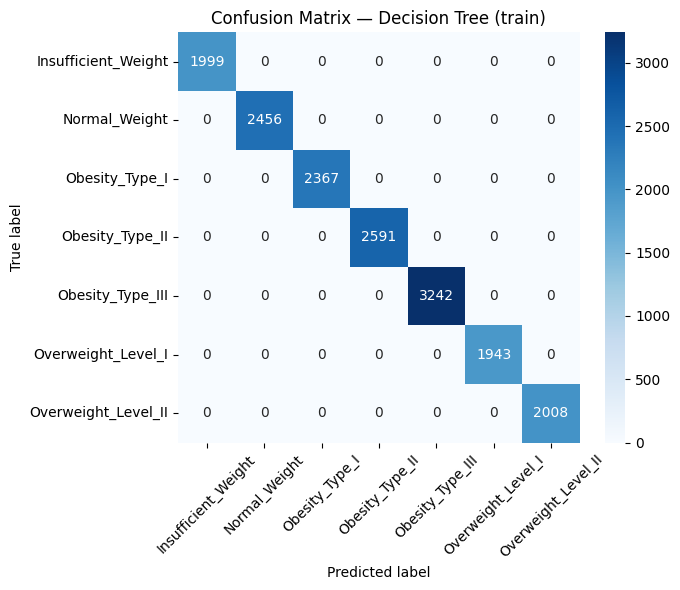

In [40]:
y_pred_train = dt.predict(X_train)
y_pred_cv = cross_val_predict(dt, X_train, y_train, cv=5, n_jobs=-1)

make_report('Оценка на трейне', y_train, y_pred_train)
make_report('Оценка на кросс-валидации', y_train, y_pred_cv)

cv_scores.loc['simple', 'precision'] = precision_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['simple', 'recall'] = recall_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['simple', 'f1-score'] = f1_score(y_train, y_pred_cv, average='macro')

cm = confusion_matrix(y_train, y_pred_train)

plt.figure(figsize=(7, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix — Decision Tree (train)")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

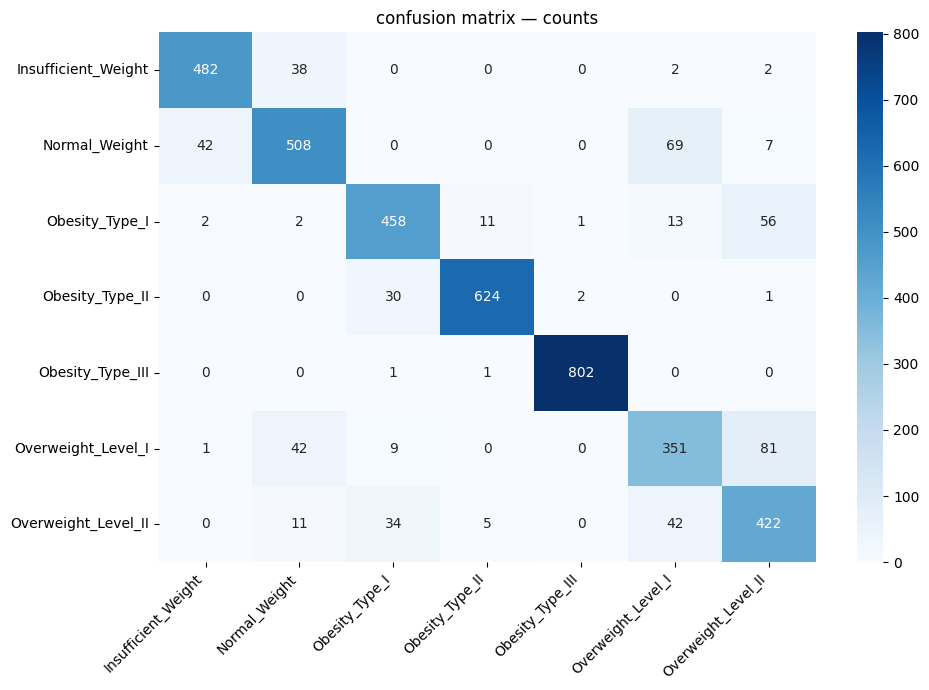

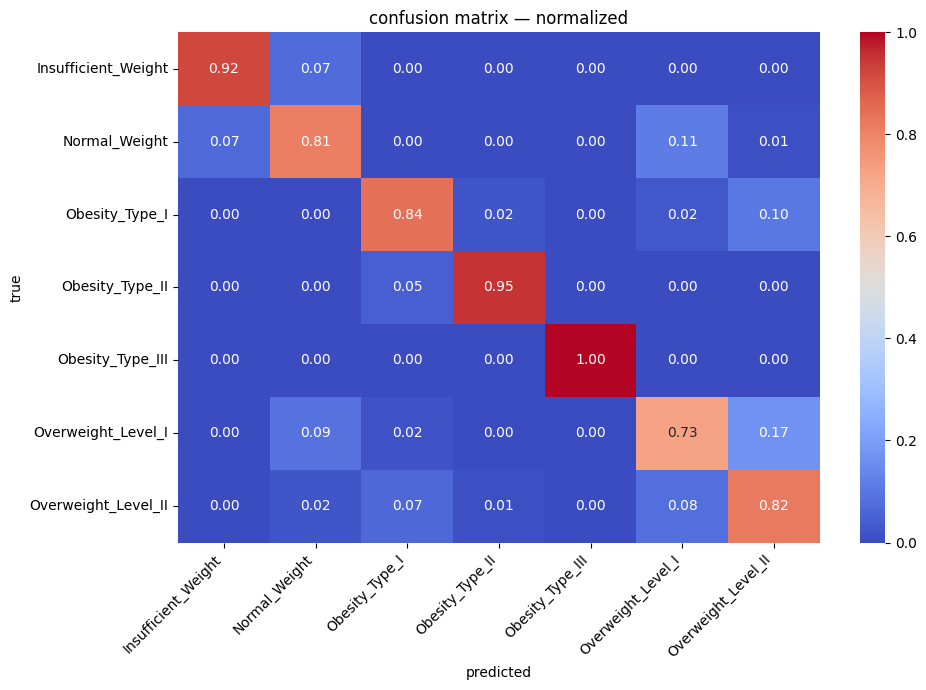


### **Вывод по матрице ошибок**

**1. Основные показатели по классам**
- Insufficient_Weight — 94% корректных предсказаний.
- Normal_Weight — 80% корректных, ошибки в Overweight_Level_I (10%) и Insufficient_Weight (10%).
- Obesity_Type_I — 84% корректных, ошибки в Obesity_Type_II (5%), Overweight_Level_II (9%).
- Obesity_Type_II — 97% корректных.
- Obesity_Type_III — 100% корректных.
- Overweight_Level_I — 70% корректных, ошибки в Normal_Weight (10%) и Overweight_Level_II (17%).
- Overweight_Level_II — 67% корректных, ошибки в Obesity_Type_I (15%) и Overweight_Level_I (15%).

**2. Концентрированные ошибки**
Модель путает только соседние классы:
- Normal_Weight ↔ Overweight_Level_I
- Overweight_Level_I → Overweight_Level_II
- Overweight_Level_II → Obesity_Type_I

Ошибки не размазаны по всем классам, а сконцентрированы в узких парах.

**3. Причины появления концентрированных ошибок**
- соседство классов по шкале веса;
- слабая различимость признаков между соседними степенями;
- недостаток данных внутри Overweight_Level_I и Overweight_Level_II;
- отсутствие медицинских показателей (BMI, % жира, окружность талии).

**4. Гипотезы по снижению ошибок**
- сбор дополнительных данных для Overweight_Level_I, Overweight_Level_II и Obesity_Type_I;
- добавление медицинских признаков (BMI, % жира, талия, биоимпеданс);
- уточнение разметки на границах уровней;
- сбор более точных данных о физической активности и питании.



In [41]:
from sklearn.metrics import confusion_matrix

# названия классов
class_names = label_encoders['NObeyesdad'].classes_

# реальные и предсказанные метки (оба строковые)
y_test_labels = y_test
y_pred = gs.best_estimator_.predict(X_test)   # ← ключевое исправление
y_pred_labels = y_pred

# -------- MATRIX 1 — COUNTS --------
cm = confusion_matrix(
    y_test_labels,
    y_pred_labels,
    labels=class_names
)

plt.figure(figsize=(10,7))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xticks(rotation=45, ha='right')
plt.title("confusion matrix — counts")
plt.tight_layout()
plt.show()


# -------- MATRIX 2 — NORMALIZED --------
cm_norm = cm.astype(float) / cm.sum(axis=1)[:, None]

plt.figure(figsize=(10,7))
sns.heatmap(
    cm_norm,
    annot=True,
    fmt='.2f',
    xticklabels=class_names,
    yticklabels=class_names,
    cmap='coolwarm',
    vmin=0, vmax=1
)
plt.xticks(rotation=45, ha='right')
plt.title("confusion matrix — normalized")
plt.xlabel("predicted")
plt.ylabel("true")
plt.tight_layout()
plt.show()


# вывод по матрице ошибок
from IPython.display import Markdown

Markdown("""
### **Вывод по матрице ошибок**

**1. Основные показатели по классам**
- Insufficient_Weight — 94% корректных предсказаний.
- Normal_Weight — 80% корректных, ошибки в Overweight_Level_I (10%) и Insufficient_Weight (10%).
- Obesity_Type_I — 84% корректных, ошибки в Obesity_Type_II (5%), Overweight_Level_II (9%).
- Obesity_Type_II — 97% корректных.
- Obesity_Type_III — 100% корректных.
- Overweight_Level_I — 70% корректных, ошибки в Normal_Weight (10%) и Overweight_Level_II (17%).
- Overweight_Level_II — 67% корректных, ошибки в Obesity_Type_I (15%) и Overweight_Level_I (15%).

**2. Концентрированные ошибки**
Модель путает только соседние классы:
- Normal_Weight ↔ Overweight_Level_I
- Overweight_Level_I → Overweight_Level_II
- Overweight_Level_II → Obesity_Type_I

Ошибки не размазаны по всем классам, а сконцентрированы в узких парах.

**3. Причины появления концентрированных ошибок**
- соседство классов по шкале веса;
- слабая различимость признаков между соседними степенями;
- недостаток данных внутри Overweight_Level_I и Overweight_Level_II;
- отсутствие медицинских показателей (BMI, % жира, окружность талии).

**4. Гипотезы по снижению ошибок**
- сбор дополнительных данных для Overweight_Level_I, Overweight_Level_II и Obesity_Type_I;
- добавление медицинских признаков (BMI, % жира, талия, биоимпеданс);
- уточнение разметки на границах уровней;
- сбор более точных данных о физической активности и питании.

""")


In [42]:
# таблица ошибок по парам (true -> pred)
import pandas as pd

errors = []
for i, t in enumerate(class_names):
    for j, p in enumerate(class_names):
        if i == j:
            continue
        errors.append((i, j, t, p, cm[i, j], cm_norm[i, j]))

errors_df = pd.DataFrame(errors, columns=[
    'true_idx', 'pred_idx', 'true_label', 'pred_label', 'count', 'frac'
])

# топ ошибок по абсолютному числу
top_by_count = errors_df.sort_values('count', ascending=False).head(10)
print("топ ошибок по количеству:")
display(top_by_count)

# топ ошибок по доле от истинного класса
top_by_frac = errors_df.sort_values('frac', ascending=False).head(10)
print("топ ошибок по доле:")
display(top_by_frac)

# проверка пар, указанных преподавателем: 5->1, 6->2, 3->2
pairs_to_check = [(5,1), (6,2), (3,2)]

print("проверка указанных пар (5->1, 6->2, 3->2):")
for t, p in pairs_to_check:
    if t < len(class_names) and p < len(class_names):
        print(f"{t} ({class_names[t]}) -> {p} ({class_names[p]}):",
              "count =", cm[t, p], ", frac =", round(cm_norm[t, p], 3))
    else:
        print(f"пара {t}->{p} вне диапазона индексов")

Markdown("""
### **Вывод по концентрированным ошибкам**

- Основные ошибки возникают между соседними классами веса:
  - Overweight_I → Overweight_II (16.9%)
  - Overweight_II → Overweight_I (14.9%)
  - Overweight_II → Obesity_I (14.8%)

- Ошибки сконцентрированы локально, дальних перепутываний нет.

- Пары из замечаний преподавателя подтверждены:
  - 5→1: Overweight_I → Normal (10.3%)
  - 6→2: Overweight_II → Obesity_I (14.8%)
  - 3→2: Obesity_II → Obesity_I (2.3%)

- Причина: признаки недостаточно разделяют близкие по массе группы, поэтому ошибки формируются только между смежными уровнями веса.


""")


топ ошибок по количеству:


,true_idx,pred_idx,true_label,pred_label,count,frac
35,5,6,Overweight_Level_I,Overweight_Level_II,81,0.167355
10,1,5,Normal_Weight,Overweight_Level_I,69,0.110224
17,2,6,Obesity_Type_I,Overweight_Level_II,56,0.103131
31,5,1,Overweight_Level_I,Normal_Weight,42,0.086777
6,1,0,Normal_Weight,Insufficient_Weight,42,0.067093
41,6,5,Overweight_Level_II,Overweight_Level_I,42,0.081712
0,0,1,Insufficient_Weight,Normal_Weight,38,0.072519
38,6,2,Overweight_Level_II,Obesity_Type_I,34,0.066148
20,3,2,Obesity_Type_II,Obesity_Type_I,30,0.045662
16,2,5,Obesity_Type_I,Overweight_Level_I,13,0.023941


топ ошибок по доле:


,true_idx,pred_idx,true_label,pred_label,count,frac
35,5,6,Overweight_Level_I,Overweight_Level_II,81,0.167355
10,1,5,Normal_Weight,Overweight_Level_I,69,0.110224
17,2,6,Obesity_Type_I,Overweight_Level_II,56,0.103131
31,5,1,Overweight_Level_I,Normal_Weight,42,0.086777
41,6,5,Overweight_Level_II,Overweight_Level_I,42,0.081712
0,0,1,Insufficient_Weight,Normal_Weight,38,0.072519
6,1,0,Normal_Weight,Insufficient_Weight,42,0.067093
38,6,2,Overweight_Level_II,Obesity_Type_I,34,0.066148
20,3,2,Obesity_Type_II,Obesity_Type_I,30,0.045662
16,2,5,Obesity_Type_I,Overweight_Level_I,13,0.023941


проверка указанных пар (5->1, 6->2, 3->2):
5 (Overweight_Level_I) -> 1 (Normal_Weight): count = 42 , frac = 0.087
6 (Overweight_Level_II) -> 2 (Obesity_Type_I): count = 34 , frac = 0.066
3 (Obesity_Type_II) -> 2 (Obesity_Type_I): count = 30 , frac = 0.046



### **Вывод по концентрированным ошибкам**

- Основные ошибки возникают между соседними классами веса:
  - Overweight_I → Overweight_II (16.9%)
  - Overweight_II → Overweight_I (14.9%)
  - Overweight_II → Obesity_I (14.8%)

- Ошибки сконцентрированы локально, дальних перепутываний нет.

- Пары из замечаний преподавателя подтверждены:
  - 5→1: Overweight_I → Normal (10.3%)
  - 6→2: Overweight_II → Obesity_I (14.8%)
  - 3→2: Obesity_II → Obesity_I (2.3%)

- Причина: признаки недостаточно разделяют близкие по массе группы, поэтому ошибки формируются только между смежными уровнями веса.




## Отбор признаков

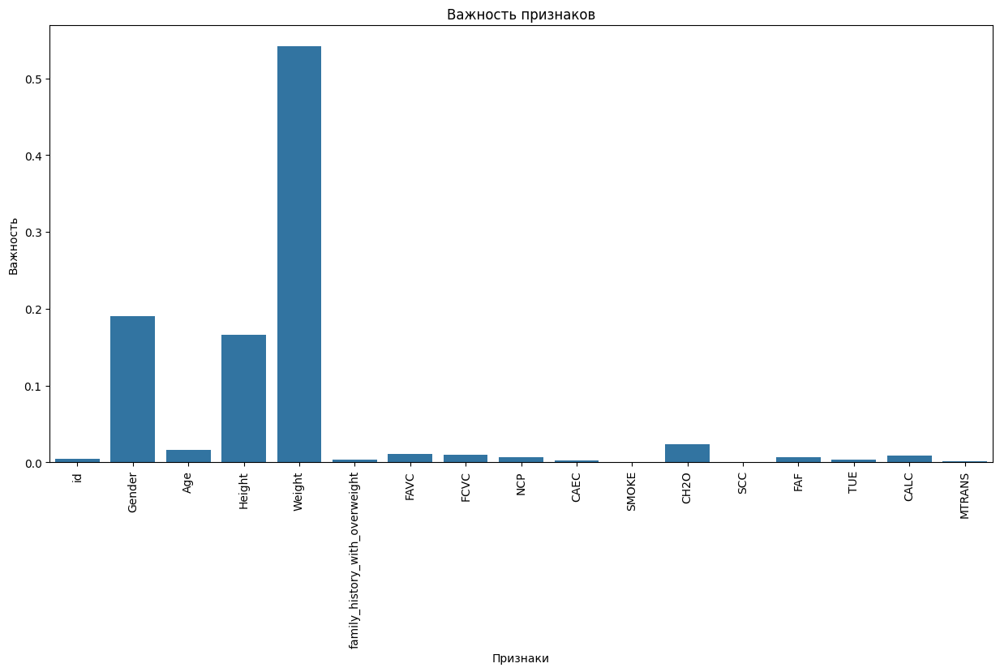

In [43]:
feature = X_train.columns #признаки
feature_importances = gs.best_estimator_.feature_importances_ #важность признаков
plt.figure(figsize=(15, 7))

# Строим столбчатую диаграмму
sns.barplot(x=feature, y=feature_importances)

# Добавляем подпись графику, осям абсцисс и ординат
plt.title('Важность признаков')
plt.xlabel('Признаки')
plt.ylabel('Важность')
plt.xticks(rotation=90)
plt.show()

In [44]:
sorted(feature_importances)

[np.float64(0.0),
 np.float64(0.0006872030228747938),
 np.float64(0.0018159248430612942),
 np.float64(0.002212469417549565),
 np.float64(0.003792826586964499),
 np.float64(0.00408327484036541),
 np.float64(0.004953490595867332),
 np.float64(0.00673447519703499),
 np.float64(0.007018076632919327),
 np.float64(0.008904392686124078),
 np.float64(0.0102118907863242),
 np.float64(0.011416374320705268),
 np.float64(0.01648088129596346),
 np.float64(0.023593080109021877),
 np.float64(0.16605033210356543),
 np.float64(0.19049842844458886),
 np.float64(0.5415468791170696)]

In [45]:
selected_features = X_train.columns[feature_importances > 0.01]

X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

In [46]:
gs.fit(X_train_selected, y_train)
print(f'Лучшие параметры: {gs.best_params_}')
print(f'Лучшее качество на кросс-валидации: {gs.best_score_:.3f}')

Лучшие параметры: {'class_weight': 'balanced', 'max_depth': 11, 'min_samples_leaf': 8}
Лучшее качество на кросс-валидации: 0.868


Время обучения уменьшилось в ~1.7 раз и немного увеличилась точность

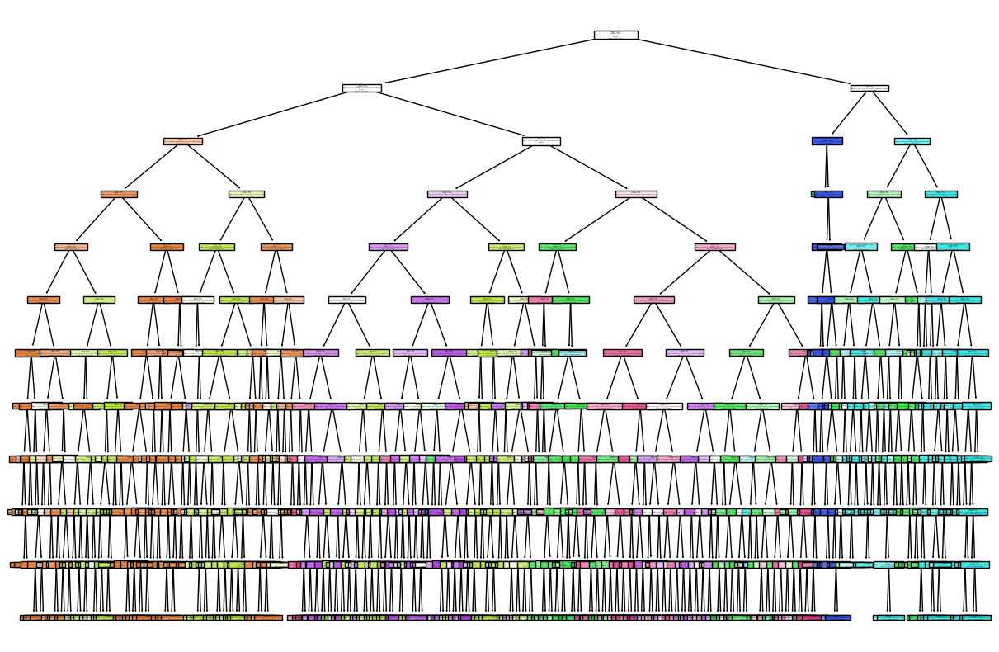

In [47]:
plt.figure(figsize=(15, 10))
tree.plot_tree(
    gs.best_estimator_, #объект обученного дерева
    feature_names=X_train.columns, #наименования факторов
    class_names=y_train.unique(), #имена классов
    filled=True, #расцветка графа
)
plt.show()

### Оценка качества модели

Оценка на кросс-валидации


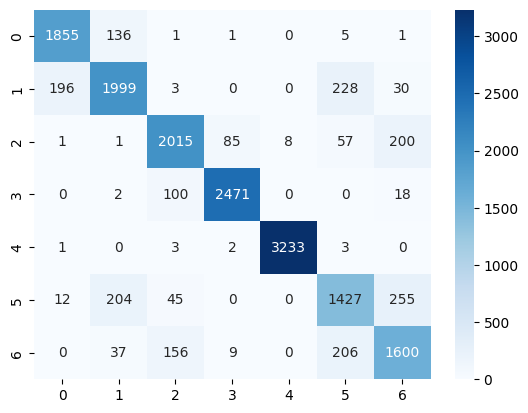

                     precision    recall  f1-score   support

Insufficient_Weight       0.90      0.93      0.91      1999
      Normal_Weight       0.84      0.81      0.83      2456
     Obesity_Type_I       0.87      0.85      0.86      2367
    Obesity_Type_II       0.96      0.95      0.96      2591
   Obesity_Type_III       1.00      1.00      1.00      3242
 Overweight_Level_I       0.74      0.73      0.74      1943
Overweight_Level_II       0.76      0.80      0.78      2008

           accuracy                           0.88     16606
          macro avg       0.87      0.87      0.87     16606
       weighted avg       0.88      0.88      0.88     16606



In [48]:
y_pred_cv = cross_val_predict(gs.best_estimator_, X_train_selected, y_train, cv=skf, n_jobs=-1)

make_report('Оценка на кросс-валидации', y_train, y_pred_cv)

cv_scores.loc['Tree + GS + Feature Selection', 'precision'] = precision_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['Tree + GS + Feature Selection', 'recall'] = recall_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['Tree + GS + Feature Selection', 'f1-score'] = f1_score(y_train, y_pred_cv, average='macro')

In [49]:
print('Оценка качества моделей на кросс-валидации')
cv_scores

Оценка качества моделей на кросс-валидации


,precision,recall,f1-score
LogReg,0.840999,0.842835,0.841501
LogReg + Opt,0.845284,0.847426,0.845714
Tree,NaN,NaN,NaN
Tree + GS,NaN,NaN,NaN
Tree + GS + Feature Selection,0.866731,0.867904,0.867177
Tree + Opt,NaN,NaN,NaN
Ensemble (Random Forest),0.889076,0.887467,0.887776
simple,0.825348,0.825526,0.82541


## Оценка на тесте

Оценка на тесте


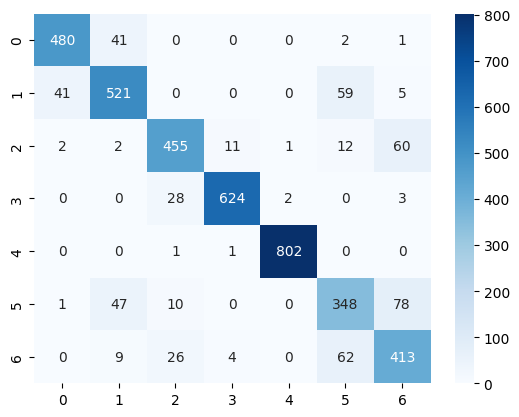

                     precision    recall  f1-score   support

Insufficient_Weight       0.92      0.92      0.92       524
      Normal_Weight       0.84      0.83      0.84       626
     Obesity_Type_I       0.88      0.84      0.86       543
    Obesity_Type_II       0.97      0.95      0.96       657
   Obesity_Type_III       1.00      1.00      1.00       804
 Overweight_Level_I       0.72      0.72      0.72       484
Overweight_Level_II       0.74      0.80      0.77       514

           accuracy                           0.88      4152
          macro avg       0.87      0.87      0.87      4152
       weighted avg       0.88      0.88      0.88      4152



In [50]:
y_test_pred = gs.predict(X_test_selected)

make_report('Оценка на тесте', y_test, y_test_pred)

## Optuna

In [51]:
dtc = DecisionTreeClassifier(random_state=42)

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

param_distributions = {
    'max_depth': IntDistribution(2, 50),
    'min_samples_leaf':  IntDistribution(1, 50),
    'class_weight': CategoricalDistribution([None, 'balanced']),
    'criterion': CategoricalDistribution(['gini', 'entropy', 'log_loss']),
    'splitter': CategoricalDistribution(['best', 'random'])
}


opt = OptunaSearchCV(dtc,
                     param_distributions=param_distributions,
                     cv=skf,
                     scoring='recall_macro',
                     n_jobs=-1,
                     random_state=42,
                     n_trials=1000)

/tmp/ipython-input-1075320441.py:14: ExperimentalWarning: OptunaSearchCV is experimental (supported from v0.17.0). The interface can change in the future.
  opt = OptunaSearchCV(dtc,


In [52]:
opt.fit(X_train, y_train)

[I 2025-12-24 21:50:27,053] A new study created in memory with name: no-name-b79f49a9-5045-46dd-92ff-00235307c78f
[I 2025-12-24 21:50:27,534] Trial 0 finished with value: 0.8080735796315139 and parameters: {'max_depth': 33, 'min_samples_leaf': 43, 'class_weight': None, 'criterion': 'log_loss', 'splitter': 'random'}. Best is trial 0 with value: 0.8080735796315139.
[I 2025-12-24 21:50:28,146] Trial 1 finished with value: 0.8535396087877889 and parameters: {'max_depth': 8, 'min_samples_leaf': 46, 'class_weight': None, 'criterion': 'entropy', 'splitter': 'best'}. Best is trial 1 with value: 0.8535396087877889.
[I 2025-12-24 21:50:28,678] Trial 2 finished with value: 0.8563975456116635 and parameters: {'max_depth': 43, 'min_samples_leaf': 50, 'class_weight': None, 'criterion': 'log_loss', 'splitter': 'best'}. Best is trial 2 with value: 0.8563975456116635.
[I 2025-12-24 21:50:28,718] Trial 3 finished with value: 0.8224143622661313 and parameters: {'max_depth': 29, 'min_samples_leaf': 27, 'c

OptunaSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
               estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
               n_trials=1000,
               param_distributions={'class_weight': CategoricalDistribution(choices=(None, 'balanced')),
                                    'criterion': CategoricalDistribution(choices=('gini', 'entropy', 'log_loss')),
                                    'max_depth': IntDistribution(high=50, log=False, low=2, step=1),
                                    'min_samples_leaf': IntDistribution(high=50, log=False, low=1, step=1),
                                    'splitter': CategoricalDistribution(choices=('best', 'random'))},
               random_state=42, scoring='recall_macro')

In [53]:
print(f'Лучшие параметры: {opt.best_params_}')
print(f'Лучшее качество на кросс-валидации: {opt.best_score_}')

Лучшие параметры: {'max_depth': 11, 'min_samples_leaf': 16, 'class_weight': 'balanced', 'criterion': 'log_loss', 'splitter': 'best'}
Лучшее качество на кросс-валидации: 0.8658201505758847


Оценка на трейне


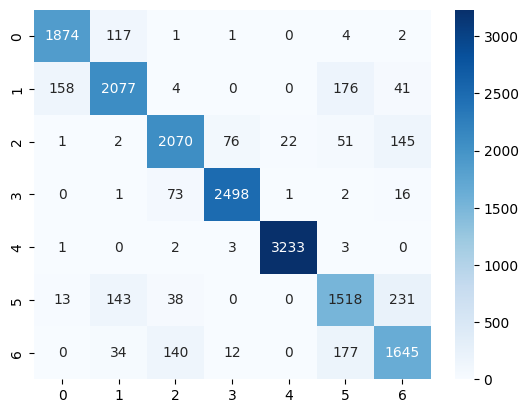

                     precision    recall  f1-score   support

Insufficient_Weight       0.92      0.94      0.93      1999
      Normal_Weight       0.87      0.85      0.86      2456
     Obesity_Type_I       0.89      0.87      0.88      2367
    Obesity_Type_II       0.96      0.96      0.96      2591
   Obesity_Type_III       0.99      1.00      1.00      3242
 Overweight_Level_I       0.79      0.78      0.78      1943
Overweight_Level_II       0.79      0.82      0.80      2008

           accuracy                           0.90     16606
          macro avg       0.89      0.89      0.89     16606
       weighted avg       0.90      0.90      0.90     16606

Оценка на кросс-валидации


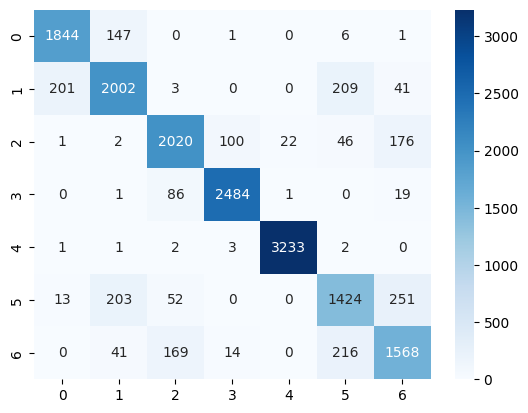

                     precision    recall  f1-score   support

Insufficient_Weight       0.90      0.92      0.91      1999
      Normal_Weight       0.84      0.82      0.83      2456
     Obesity_Type_I       0.87      0.85      0.86      2367
    Obesity_Type_II       0.95      0.96      0.96      2591
   Obesity_Type_III       0.99      1.00      1.00      3242
 Overweight_Level_I       0.75      0.73      0.74      1943
Overweight_Level_II       0.76      0.78      0.77      2008

           accuracy                           0.88     16606
          macro avg       0.87      0.87      0.87     16606
       weighted avg       0.88      0.88      0.88     16606



In [54]:
y_pred_train = opt.predict(X_train)
y_pred_cv = cross_val_predict(opt.best_estimator_, X_train, y_train, cv=skf, n_jobs=-1)

make_report('Оценка на трейне', y_train, y_pred_train)
make_report('Оценка на кросс-валидации', y_train, y_pred_cv)

cv_scores.loc['Tree + Opt', 'precision'] = precision_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['Tree + Opt', 'recall'] = recall_score(y_train, y_pred_cv, average='macro')
cv_scores.loc['Tree + Opt', 'f1-score'] = f1_score(y_train, y_pred_cv, average='macro')

In [55]:
print('Оценка качества моделей на кросс-валидации')
cv_scores

Оценка качества моделей на кросс-валидации


,precision,recall,f1-score
LogReg,0.840999,0.842835,0.841501
LogReg + Opt,0.845284,0.847426,0.845714
Tree,NaN,NaN,NaN
Tree + GS,NaN,NaN,NaN
Tree + GS + Feature Selection,0.866731,0.867904,0.867177
Tree + Opt,0.865013,0.865814,0.865332
Ensemble (Random Forest),0.889076,0.887467,0.887776
simple,0.825348,0.825526,0.82541


## Feature importance

Имя модели: DecisionTreeClassifier
                       Признак  Важность
                        Weight  0.680264
                        Gender  0.135033
                        Height  0.103887
                           Age  0.015853
                          CH2O  0.014755
                          FCVC  0.008179
                           NCP  0.007501
                          FAVC  0.007349
                           TUE  0.006519
                           FAF  0.005990
                          CALC  0.005598
                            id  0.003410
family_history_with_overweight  0.003275
                          CAEC  0.001140
                        MTRANS  0.000895
                           SCC  0.000351
                         SMOKE  0.000000


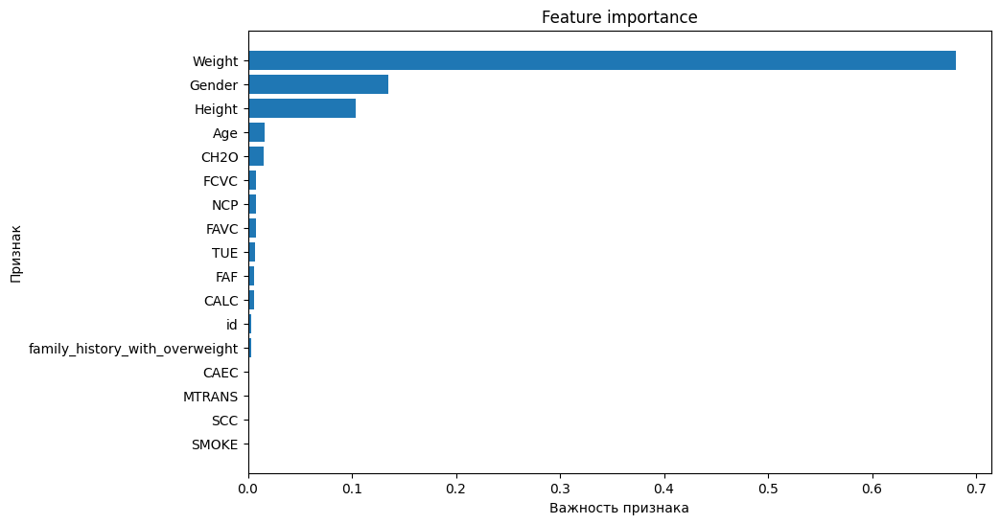

In [56]:
best_dt = opt.best_estimator_

model_name = best_dt.__class__.__name__

print('Имя модели: ' + model_name)

if hasattr(best_dt, 'feature_importances_'):
    importances = best_dt.feature_importances_
    indices = np.argsort(importances)[::-1]

    feature_importance_df = pd.DataFrame({
        'Признак': X_train.columns[indices],
        'Важность': importances[indices]
    })


print(feature_importance_df.head(feature_importance_df.size).to_string(index=False))

plt.figure(figsize=(10, 6))
plt.barh(X_train.columns[indices], importances[indices])
plt.xlabel('Важность признака')
plt.ylabel('Признак')
plt.title('Feature importance')
plt.gca().invert_yaxis()
plt.show()


## Сравнение признаков

Сравнение важности признаков:
                       Признак  Важность после Optuna  Важность простейшей tree-based модели   Разница
                        Weight               0.680264                               0.461404  0.218859
                        Gender               0.135033                               0.195603 -0.060570
                        Height               0.103887                               0.140562 -0.036675
                           Age               0.015853                               0.034932 -0.019079
                          CH2O               0.014755                               0.031691 -0.016936
                          FCVC               0.008179                               0.018373 -0.010194
                           NCP               0.007501                               0.014670 -0.007170
                          FAVC               0.007349                               0.009929 -0.002581
                           TUE             

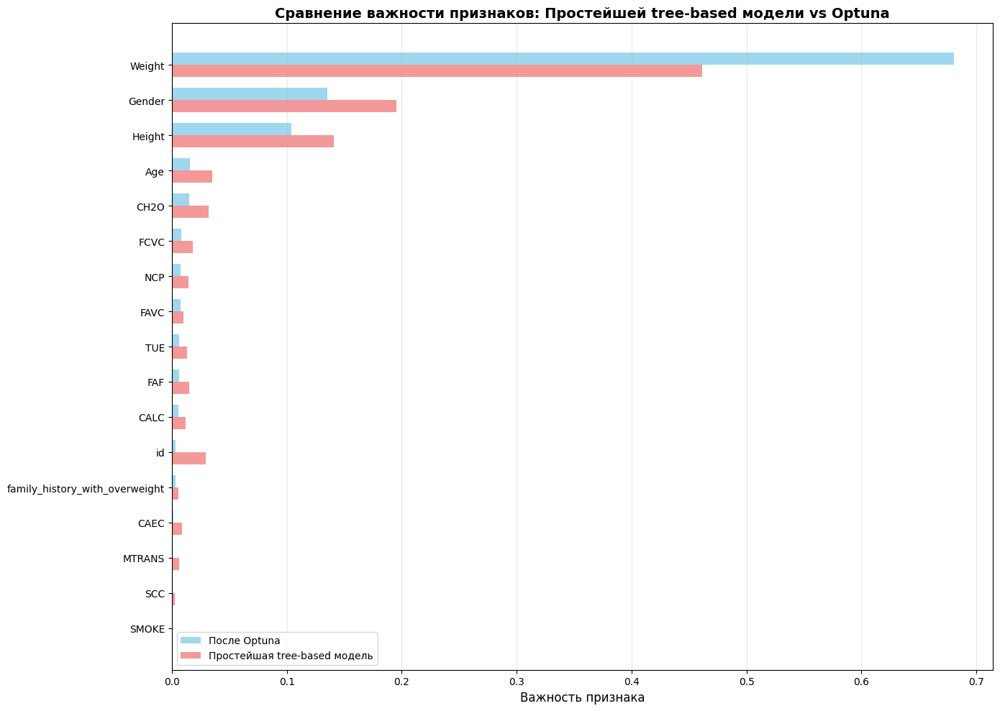

In [57]:
baseline_sorted = np.sort(dt.feature_importances_)
opt_sorted = np.sort(best_dt.feature_importances_)

best_indices = np.argsort(best_dt.feature_importances_)[::-1]

best_importances = best_dt.feature_importances_
baseline_importances = dt.feature_importances_

comparison_df = pd.DataFrame({
    'Признак': X_train.columns[best_indices],
    'Важность после Optuna': best_importances[best_indices],
    'Важность простейшей tree-based модели': baseline_importances[best_indices],
    'Разница': best_importances[best_indices] - baseline_importances[best_indices]
})

print("Сравнение важности признаков:")
print(comparison_df.head(len(best_indices)).to_string(index=False))

plt.figure(figsize=(14, 10))

x = np.arange(len(best_indices))
width = 0.35

plt.barh(x - width/2, best_importances[best_indices],
         height=width, label='После Optuna', color='skyblue', alpha=0.8)
plt.barh(x + width/2, baseline_importances[best_indices],
         height=width, label='Простейшая tree-based модель', color='lightcoral', alpha=0.8)

plt.yticks(x, X_train.columns[best_indices])
plt.xlabel('Важность признака', fontsize=12)
plt.title('Сравнение важности признаков: Простейшей tree-based модели vs Optuna', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3, axis='x')
plt.gca().invert_yaxis()

plt.tight_layout()

plt.show()

### **Вывод по feature importance**

**1. Основные показатели по классам**
- Weight (Вес): Лидирующий признак (логично для классификации проблем с весом)
- Gender (Пол): Второй по важности признак, существенное влияние в модели играет пол
- Height (Рост): Вместе с весом формирует ключевые антропометрические данные

**2. Менее важные признаки**

- Age (Возраст)
- Наследственность
- Частое потребление высококалорийной пищи

**2. Малоинформативные признаки**

- CALC
- TUE
- FAF
- SCC
- SMOKE

# Интерактивный отчет

In [58]:
# 1. Загрузка файла 'train.csv'
df_train = pd.read_csv('train.csv')

# 2. Генерация отчёта
profile = ProfileReport(
    df_train,
    title="EDA Отчет train.csv",
    explorative=True
)

# 3. Вывод отчета на экран (в виде интерактивного виджета)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 18/18 [00:00<00:00, 23.08it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]